# Getting Started with `feems` - wolves data set

Running an analysis on data set in [Schweizer et al. 2016](https://onlinelibrary.wiley.com/doi/full/10.1111/mec.13364?casa_token=idW0quVPOU0AAAAA%3Ao_ll85b8rDbnW3GtgVeeBUB4oDepm9hQW3Y445HI84LC5itXsiH9dGO-QYGPMsuz0b_7eNkRp8Mf6tlW), similar to analyses in other notebooks...

In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
from datetime import date
import pkg_resources
from sklearn.impute import SimpleImputer
from pandas_plink import read_plink
from copy import deepcopy
import itertools as it
import statsmodels.api as sm
from scipy.stats.distributions import chi2
import scipy as sp
from joblib import Parallel, delayed
from random import choices
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics.pairwise import haversine_distances

# viz
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import seaborn as sns
import plotly.express as px

# wolves_graph
import os
import sys
sys.path.append('../../')
from feems.utils import prepare_graph_inputs
from feems.spatial_graph import query_node_attributes
from feems import SpatialGraph, Viz, Objective
from feems.cross_validation import run_cv, comp_mats, run_cv_joint
from feems.helper_funcs import cov_to_dist, comp_genetic_vs_fitted_distance, plot_default_vs_long_range, get_best_lre
from feems.joint_ver import FEEMSmix_SpatialGraph, FEEMSmix_Objective

# change matplotlib fonts
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.sans-serif"] = "Arial"

Note we have packaged this example dataset in the `feems` package and use the `pkg_resources` package to find the path of those files:

In [155]:
data_path = pkg_resources.resource_filename("feems", "data/")

Next we read the `plink` formatted genotype data and impute any missing SNPs with the mean at each SNP:

In [3]:
# read the genotype data and mean impute missing data
(bim, fam, G) = read_plink("{}/wolvesadmix".format(data_path))
imp = SimpleImputer(missing_values=np.nan, strategy="mean")
genotypes = imp.fit_transform((np.array(G)).T)

print("n_samples={}, n_snps={}".format(genotypes.shape[0], genotypes.shape[1]))

Mapping files:   0%|          | 0/3 [00:00<?, ?it/s]

Mapping files: 100%|██████████| 3/3 [00:00<00:00, 71.63it/s]

n_samples=111, n_snps=17729


In [156]:
# setup graph
coord = np.loadtxt("{}/wolvesadmix.coord".format(data_path))  # sample coordinates
outer = np.loadtxt("{}/wolvesadmix.outer".format(data_path))  # outer coordinates
grid_path = "{}/grid_50.shp".format(data_path)  # path to discrete global grid

# graph input files
# outer, edges, grid, _ = prepare_graph_inputs(coord=coord, 
#                                              ggrid=grid_path,
#                                              translated=False, 
#                                              buffer=1,
#                                              outer=outer)

In [ ]:
# admixinds = np.array([12,14,15,16,17,60,62,78,79,80,81,82,84,85,87,92,103])-1
# nonadmix_geno = genotypes[[i for i in range(111) if i not in admixinds],:]
# nonadmix_geno = np.delete(nonadmix_geno,np.where(nonadmix_geno.sum(axis=0)==0)[0],1)
# nonadmix_geno = np.delete(nonadmix_geno,np.where(nonadmix_geno.sum(axis=0)==2*nonadmix_geno.shape[0])[0],1)

In [211]:
# wolves_graph = SpatialGraph(genotypes, coord, grid, edges)
# wolves_graph = FEEMSmix_SpatialGraph(nonadmix_geno, coord[[i for i in range(111) if i not in admixinds],:], grid, edges)
wolves_graph.fit(lamb=.01, optimize_q=None)
obj = FEEMSmix_Objective(wolves_graph);

constant-w/variance fit, converged in 130 iterations, train_loss=2352759.131
lambda=0.010, alpha=0.8581, converged in 649 iterations, train_loss=2307947.756


### Creating SpaceMix input data (using the allele frequency matrix + sample size)

In [18]:
# np.savetxt("/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/spacemix_freq.txt",wolves_graph.frequencies*np.sqrt(wolves_graph.mu*(1-wolves_graph.mu))/2)
# np.savetxt("/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/spacemix_ss.txt",wolves_graph.n_samples_per_obs_node_permuted)
# longlat = []
# for i in range(wolves_graph.n_observed_nodes):
#     longlat.append(list(wolves_graph.nodes[permuted_idx[i]]['pos']))
# np.savetxt("/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/spacemix_longlat.txt",np.array(longlat))
# wolvesmeta = pd.read_csv('/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/SequencedSamples_MASTER_Canada_JN.csv')
# wolvesmeta['IID'] = np.repeat(0,len(wolvesmeta))
# for i in range(len(wolvesmeta)):
#     try:
#         wolvesmeta['IID'].iloc[i] = np.where(coord==[float(wolvesmeta['Long'].iloc[i]),float(wolvesmeta['Long'].iloc[i])])[0][0]
#     except:
#         wolvesmeta['IID'].iloc[i] = np.nan
# wolvesmeta['IID']
# [wolvesmeta['On Affy SNP array?'][wolvesmeta['On Affy SNP array?']==i].index for i in fam['fid']]
# wolvesdate = pd.read_csv('{}/wolvesadmix.date'.format(data_path),sep=' ',header=None,names=['iid','date'])
# wolvesdate['date'].iloc[20].split('-')[0] 
# winter = ['11','12','01','02','03','04']

### Creating TreeMix input data (using the clustered allele counts)

In [191]:
# import networkx as nx
# sample_idx = nx.get_node_attributes(wolves_graph, "sample_idx")

# treemixdf = pd.DataFrame(columns=permuted_idx[:wolves_graph.n_observed_nodes], index=range(wolves_graph.n_snps))
# for i, node_id in enumerate(permuted_idx[:wolves_graph.n_observed_nodes]):
#     s = sample_idx[node_id]

#     allele_counts = np.sum(wolves_graph.genotypes[s, :], axis=0)
#     treemixdf[node_id] = [str(int(ac)) + ',' + str(int(2*wolves_graph.n_samples_per_obs_node_permuted[i] - ac)) for ac in allele_counts]    

# treemixdf.to_csv("/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/treemix_ac.csv", sep=' ', index=False)
# np.savetxt("/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/permidx.txt",permuted_idx[:wolves_graph.n_observed_nodes],fmt ='%.0f')
# [wolves_graph.nodes[p]['sample_idx'] for p in permuted_idx[:94]]

array([1.87433498, 1.12028772, 1.01905694, 1.82415424, 1.13804445,
       1.65682075, 0.21366003, 0.76557233, 1.77730924, 2.06717426,
       0.88715599, 0.53720739, 0.8665458 , 0.69892429, 1.23135166,
       0.84855646, 0.83660633, 0.6788034 , 0.42723663, 1.92966721,
       1.97770427, 0.823299  , 2.28487574, 1.14369992, 1.72173593,
       1.82558877, 1.85447565, 0.94260847, 1.265895  , 1.31407202,
       1.73344704, 0.97845335, 0.44424654, 1.05435244, 0.37212838,
       1.32827871, 1.99074577, 0.64738209, 0.54620673, 0.57078916,
       0.92298189, 1.19973375, 1.99809884, 1.76672696, 1.91824986,
       2.04217668, 1.26414091, 2.02224426, 1.54367107, 1.038484  ,
       0.88562565, 0.88137635, 2.34817086, 1.92425155, 1.75635096,
       1.0883298 , 0.71185217, 1.2369697 , 1.25122104, 1.32412779,
       1.83714193, 1.35471174, 1.94038596, 1.52746988, 0.23177292,
       0.93456375, 1.39114013, 0.87711166, 2.01268546, 1.8415184 ,
       1.16545767, 1.07854661, 0.83671553, 0.15924901, 1.00880

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

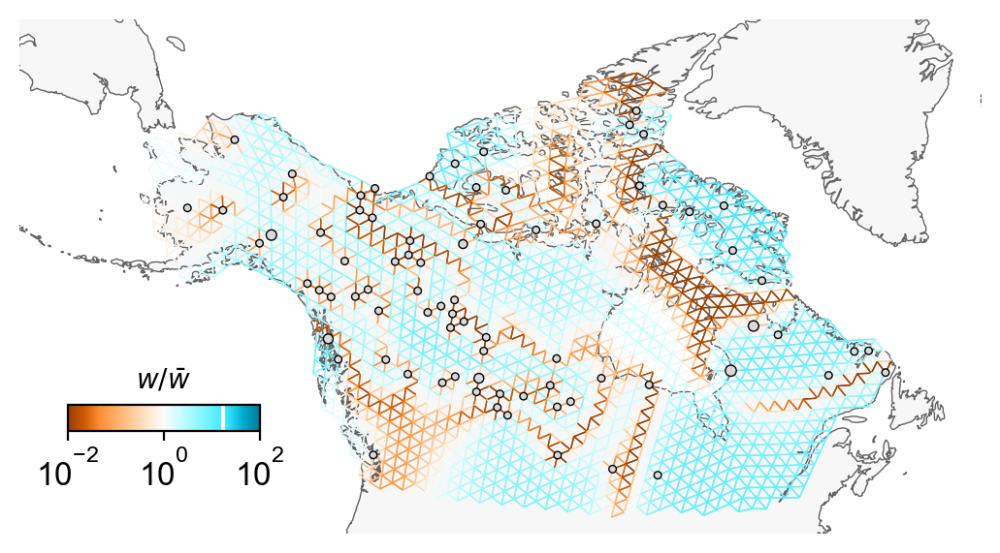

In [212]:
projection = ccrs.EquidistantConic(central_longitude=-100, central_latitude=60)   
fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection);  ax.set_extent([-160, -55, 37, 80])  
v = Viz(ax, wolves_graph, obj, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=10, 
        obs_node_size=7.5, sample_pt_color="black", obs_node_textsize=4,
        cbar_font_size=10)
v.draw_map(latlong=False); v.draw_obs_nodes(use_ids=False); v.draw_edges(use_weights=True); v.draw_edge_colorbar()
# for i in range(wolves_graph.n_observed_nodes):
#         v.ax.scatter(v.grid[permuted_idx[i],0], v.grid[permuted_idx[i],1], marker='o', color='purple', alpha=0.8, s=20/wolves_graph.q[i])
# v.ax.plot(obs_grid[permuted_idx[:94]==402,0], obs_grid[permuted_idx[:94]==402,1], 'o', color='#D7191C', alpha=0.8, markersize=11, label='FEEMSmix')
# v.ax.plot(obs_grid[permuted_idx[:94]==185,0], obs_grid[permuted_idx[:94]==185,1], 'o', color='#2B83BA', alpha=0.8, markersize=11, label='SpaceMix')
# for e in [980, 207, 621, 180, 1206]:
#     v.ax.plot(obs_grid[permuted_idx[:94]==e,0], obs_grid[permuted_idx[:94]==e,1], 'o', color='#814E6B', alpha=0.8, markersize=12)
# for e in [585, 187, 390, 747, 815]:
#     v.ax.plot(obs_grid[permuted_idx[:94]==e,0], obs_grid[permuted_idx[:94]==e,1], 'o', color='#D7191C', alpha=0.8, markersize=12)
# v.ax.legend(loc='upper right', fontsize=8)                        
# v.ax.plot(obs_grid[36, 0], obs_grid[36, 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[36, 0], central_latitude=obs_grid[36, 1]))
# for dest in np.unique(outliers_df['dest.']):
#     v.ax.plot(obs_grid[np.where(permuted_idx == dest)[0], 0], obs_grid[np.where(permuted_idx == dest)[0], 1], 'ro', markersize=20*np.log10(np.sum(outliers_df['dest.']==dest)+1), alpha=0.5)

(array([ 4.,  5.,  5., 16., 13.,  8.,  4., 11., 11.,  2.]),
 array([0.15924901, 0.37814119, 0.59703338, 0.81592556, 1.03481775,
        1.25370993, 1.47260212, 1.6914943 , 1.91038649, 2.12927867,
        2.34817086]),
 <BarContainer object of 10 artists>)

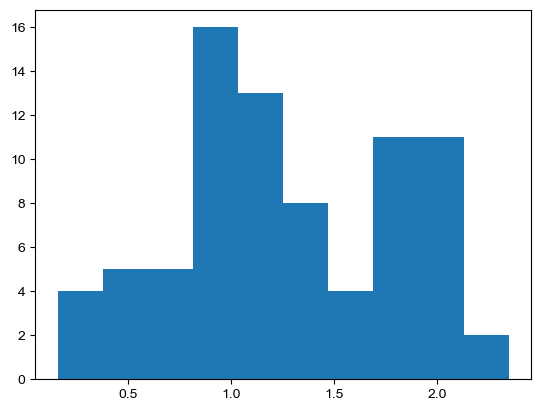

In [206]:
# import networkx as nx
# freqs = np.zeros_like(wolves_graph.frequencies)
# for i, node_id in enumerate(permuted_idx[:94]):
#     s = nx.get_node_attributes(wolves_graph, "sample_idx")[node_id]

#     # compute mean at each node
#     freqs[i,:] = np.mean(wolves_graph.genotypes[s,:], axis=0)/2
#     # freqs[i,:] = np.sum(sp_graph_jt.genotypes[s,:], axis=0)

# het = 2*freqs*(1-freqs)
# plt.plot(wolves_graph.s2[:94],het.mean(axis=1),'o',alpha=0.5)
# alls = np.zeros((sp_graph_jt.genotypes.shape[1],2))

In [396]:
# med_spacemix = [0.01937429,0.01587325,0.006617999,0.004845347,0.006708163,0.00401827,0.0122487,0.00482947,0.002456252,0.002708504,0.1000575,0.1273344,0.004317822,0.003019414,0.002672921,0.09961773,0.003418695,0.003509599,0.004024112,0.004007152,0.002642361,0.002530899,0.002384085,0.004048692,0.002563896,0.002027101,0.003977936,0.003677587,0.002896895,0.0024975,0.003149439,0.004312738,0.00227444,0.002233898,0.00183585,0.003061934,0.003979968,0.002955401,0.003338955,0.003397887,0.003521155,0.004141994,0.002927201,0.003589331,0.002817105,0.002839483,0.003985941,0.002373238,0.004032835,0.004593606,0.003228359,0.003257948,0.002662256,0.003007602,0.005200164,0.004152379,0.003113858,0.002885949,0.00408016,0.003088208,0.004521971,0.008347207,0.003670392,0.1787385,0.0041278,0.01117924,0.004548573,0.003416117,0.005115239,0.001657582,0.003911237,0.003545994,0.00273064,0.002594609,0.002706837,0.003127315,0.003432761,0.004177043,0.0009712552,0.003704936,0.006351901,0.002827244,0.003718221,0.005222881,0.007940766,0.004053953,0.003225135,0.001104474,0.002350154,0.07508196,0.004172863,0.002832125,0.001829685,0.1905081]
# low_spacemix = [0.000897215,0.000883515,0.0003152308,0.0001783414,0.0001263806,0.0002117441,0.0005691187,0.0001017287,0.0001441438,0.0001115783,0.01455387,0.009495504,0.0001391555,0.0002546154,0.0001033251,0.01418984,0.00009573956,0.0001252788,0.0001894526,0.0001786773,0.00002211429,0.000128457,0.0003422592,0.00008624158,0.0002547229,0.00004294275,0.0002931522,0.0000114855,0.0001440366,0.0001177462,0.00003943307,0.00004251546,0.0001998847,0.0001160401,0.00008392832,0.0001051864,0.0001626113,0.00009667649,0.0001383472,0.0001124294,0.0001933383,0.0001970422,0.00007637774,0.0001894598,0.0001693688,0.0001144978,0.000143404,0.0001543102,0.0002778853,0.00009854014,0.0001856883,0.0001230146,0.00003003104,0.0002553205,0.0004264873,0.0001960061,0.00001612395,0.00002108883,0.0003152421,0.000115327,0.0001492339,0.0001476192,0.0002845236,0.1262221,0.00003898708,0.0005145195,0.0002264754,0.00002980656,0.0002916458,0.0001520485,0.00003570642,0.0002020343,0.0001778328,0.0002384659,0.0001526563,0.00000255398,0.00004213508,0.00006416699,0.00004324126,0.00001642329,0.0003001758,0.000053435,0.00006740519,0.0002366941,0.0003375228,0.00002340561,0.0001733865,0.00004652174,0.00007655947,0.01808362,0.0002585558,0.00003214257,0.0001024796,0.1322754]
# upp_spacemix = [0.06045592,0.05188655,0.02948005,0.01913859,0.02871016,0.01999014,0.04940507,0.0208047,0.0221807,0.0168951,0.1478331,0.2002445,0.03671032,0.01448133,0.01237573,0.1607841,0.01388515,0.02734635,0.02258282,0.01891659,0.01537074,0.01564139,0.009627474,0.01826564,0.01896702,0.01236076,0.01249714,0.02085416,0.01279819,0.01738598,0.02163806,0.0291359,0.009757326,0.01491553,0.01398314,0.01479675,0.01537421,0.01336835,0.01662656,0.02430628,0.02067816,0.021131,0.009807138,0.01912948,0.01652029,0.01698084,0.01606524,0.01587904,0.01332922,0.02609124,0.02049717,0.01600329,0.0153979,0.01870126,0.03292576,0.02144142,0.01532726,0.01603268,0.01431206,0.01558017,0.01982415,0.04019233,0.02308869,0.2217451,0.02262178,0.04293267,0.01811621,0.02045679,0.0264703,0.01258225,0.02452506,0.02202632,0.02442458,0.01137278,0.01640466,0.01783253,0.01470676,0.01861735,0.00508181,0.02384039,0.04139652,0.01457178,0.02139582,0.02858446,0.04494716,0.02277083,0.01732321,0.008245681,0.01162835,0.1250916,0.01875431,0.01677644,0.01087549,0.2379548]

In [400]:
contour_dict = {1206:contour_df1206,980:contour_df980,180:contour_df180,189:contour_df189,402:contour_df402,207:contour_df207,585:contour_df585,747:contour_df747,621:contour_df621,187:contour_df187,390:contour_df390,815:contour_df815}

In [415]:
admix_df = pd.DataFrame(columns=['med_spacemix','low_spacemix','upp_spacemix','FEEMS_mle','dest.','type'],index=range(94))
spacemix_demes = [35, 42, 129,  180,  185,  207,  621,  632,  980, 1206]
# contour_df1206['admix. prop.'].iloc[contour_df1206['scaled log-lik'].argmax()]
# np.unique(outliers_df['dest.'])
for i in range(wolves_graph.n_observed_nodes):
    admix_df['dest.'].iloc[i] = poporder['id'].iloc[i]
    admix_df['med_spacemix'].iloc[i] = med_spacemix[i]
    admix_df['low_spacemix'].iloc[i] = low_spacemix[i]
    admix_df['upp_spacemix'].iloc[i] = upp_spacemix[i]

    if admix_df['dest.'].iloc[i] in contour_dict.keys():
        admix_df['FEEMS_mle'].iloc[i] = contour_dict[admix_df['dest.'].iloc[i]]['admix. prop.'].iloc[contour_dict[admix_df['dest.'].iloc[i]]['scaled log-lik'].argmax()]
        if admix_df['dest.'].iloc[i] in spacemix_demes:
            admix_df['type'].iloc[i] = 'FEEMS & SpaceMix'
        else:
            admix_df['type'].iloc[i] = 'FEEMS not SpaceMix'
    else:
        if admix_df['dest.'].iloc[i] in spacemix_demes:
            admix_df['type'].iloc[i] = 'SpaceMix not FEEMS'
        else:
            admix_df['type'].iloc[i] = 'Neither'
        admix_df['FEEMS_mle'].iloc[i] = np.nan

plt.figure(dpi=120)
plt.plot(admix_df['FEEMS_mle'].loc[admix_df['type']=='FEEMS not SpaceMix'],admix_df['med_spacemix'].loc[admix_df['type']=='FEEMS not SpaceMix'],'o',color='#fc8d62',alpha=0.8,label='FEEMS not SpaceMix'); plt.errorbar(admix_df['FEEMS_mle'].loc[admix_df['type']=='FEEMS not SpaceMix'],admix_df['med_spacemix'].loc[admix_df['type']=='FEEMS not SpaceMix'],yerr=np.array((admix_df['low_spacemix'].loc[admix_df['type']=='FEEMS not SpaceMix'].values,admix_df['upp_spacemix'].loc[admix_df['type']=='FEEMS not SpaceMix'].values)),fmt='none',color='#fc8d62',alpha=0.8)
plt.plot(admix_df['FEEMS_mle'].loc[admix_df['type']=='FEEMS & SpaceMix'],admix_df['med_spacemix'].loc[admix_df['type']=='FEEMS & SpaceMix'],'o',color='#8da0cb',alpha=0.8,label='FEEMS & SpaceMix'); plt.errorbar(admix_df['FEEMS_mle'].loc[admix_df['type']=='FEEMS & SpaceMix'],admix_df['med_spacemix'].loc[admix_df['type']=='FEEMS & SpaceMix'],yerr=np.array((admix_df['low_spacemix'].loc[admix_df['type']=='FEEMS & SpaceMix'].values,admix_df['upp_spacemix'].loc[admix_df['type']=='FEEMS & SpaceMix'].values)),fmt='none',color='#8da0cb',alpha=0.8); plt.legend(); plt.grid(); plt.box(False); plt.axline((0,0),slope=1,color='grey')
plt.xlabel('FEEMS MLE estimate'); plt.ylabel('SpaceMix posterior distribution'); 

In [46]:
# admix_df.loc[admix_df['type']=='SpaceMix not FEEMS']
# import pickle
# with open('/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/contour_dict_none.pkl', 'wb') as fp:
#     pickle.dump(contour_dict_none, fp)
#     print('dictionary saved successfully to file')
# with open('/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/contour_dict_ndim.pkl', 'rb') as fp:
#     contour_dict = pickle.load(fp)

In [178]:
# wolves_graph.fit(lamb=2., optimize_q='n-dim', lamb_q=1.)
# obj = FEEMSmix_Objective(wolves_graph); obj.inv(); obj.Lpinv = np.linalg.pinv(wolves_graph.L.todense()); obj.grad(reg=False)
# fit_cov, _, emp_cov = comp_mats(obj)
# fit_dist = cov_to_dist(fit_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]
# emp_dist = cov_to_dist(emp_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]
# X = sm.add_constant(fit_dist)
# mod = sm.OLS(emp_dist, X)
# res = mod.fit()
# muhat, betahat = res.params

# plt.figure(dpi=120)
# plt.hist(np.log(emp_dist)-np.log(fit_dist),bins=30,color='grey',alpha=0.8); plt.grid(); plt.box(False); plt.axvline(0,color='grey',linestyle='--',linewidth=5); plt.axvline(-2.55*np.std(np.log(emp_dist)-np.log(fit_dist)),color='red',linewidth=3,label='using SD'); plt.xlabel(r'log(emp./fit.)'); plt.axvline(med-3*mad,label='using MAD',color='b',linewidth=3); plt.legend()

# pvals = sp.stats.norm.cdf(np.log(emp_dist)-np.log(fit_dist)-np.mean(np.log(emp_dist)-np.log(fit_dist)), 0, np.std(np.log(emp_dist)-np.log(fit_dist)))
# mvals = (np.log(emp_dist)-np.log(fit_dist) - med)/mad
# x, y = [], []
# for k in np.where(mvals<-3)[0]:
#     x.append(np.floor(np.sqrt(2*k+0.25)-0.5).astype('int')+1); y.append(int(k - 0.5*x[-1]*(x[-1]-1)))

#     perm_idx[x[-1]], perm_idx[y[-1]]
# np.argsort(mvals)
# minidx = np.argsort(mvals)
# x = np.floor(np.sqrt(2*minidx[0]+0.25)-0.5).astype('int')+1; y = int(minidx[0] - 0.5*x*(x-1))

# plt.plot(fit_dist,emp_dist,'ko',alpha=0.5,markersize=5);  plt.xlabel('fitted distance'); plt.ylabel('empirical distance'); plt.grid(); plt.box(False)
# x_ = np.linspace(np.min(fit_dist), np.max(fit_dist), 20)
# plt.plot(x_, muhat + betahat * x_, zorder=2, color="orange", linestyle='--', linewidth=3)
# plt.text(4.5, 1.5, "R²={:.3f}".format(res.rsquared), size='x-large'); 
# plt.hist(1/wolves_graph.q,bins=12,color='grey'); plt.xlabel(r'$\hat q$')

# plt.plot(fit_dist,emp_dist/fit_dist-np.mean(emp_dist/fit_dist),'ko'); plt.axhline(-3*np.std(emp_dist/fit_dist),color='red'); plt.axhline(med-4*mad)
# med = np.median(np.log(emp_dist)-np.log(fit_dist))
# mad = 1.4826*np.median(np.abs(np.log(emp_dist)-np.log(fit_dist) - np.median(np.log(emp_dist)-np.log(fit_dist))))

# lamb_grid = np.geomspace(1e-2,100,10,endpoint=True)[::-1]
cv_err = run_cv(wolves_graph, lamb_grid, n_folds=50, factr=1e12)
mean_cv_err = np.mean(cv_err, axis=0)
float(lamb_grid[np.argmin(mean_cv_err)])
## cvq_err = run_cv_joint(wolves_graph, lamb_grid=lamb_grid, lamb_q_grid=lamb_grid)
# cv10_err = run_cv_joint(wolves_graph, lamb_grid=lamb_grid, lamb_q_grid=lamb_grid, n_folds=10)
# plt.plot(lamb_grid,np.nanmean(cv10_err,axis=(0,1)),'k-o',label=r'$\lambda_w$'); plt.xlabel('values'); plt.ylabel('10-fold CV error'); plt.plot(lamb_grid,np.nanmean(cv10_err,axis=(0,2)),'-o',color='grey',label=r'$\lambda_q$'); plt.semilogx(); plt.legend(); plt.grid()
# plt.imshow(np.min(np.mean(cvq_err,axis=0))-np.mean(cvq_err,axis=0),cmap='Blues'); plt.colorbar(); plt.xlabel(r'$\lambda_q$'); plt.ylabel(r'$\lambda_w$'); 
# np.unravel_index(np.argmin(np.mean(cvq_err,axis=0)),(10,10))
# sm.qqplot(np.log(emp_dist)-np.log(fit_dist)-np.mean(np.log(emp_dist)-np.log(fit_dist)),line='q')
# lle, te = get_best_lre(wolves_graph, genotypes, coord, grid, edges, k=5, top=20, nchoose=500, option='hard')


 fold= 0
iteration lambda=10/10 alpha=1/1
 fold= 1
iteration lambda=10/10 alpha=1/1
 fold= 2
iteration lambda=10/10 alpha=1/1
 fold= 3
iteration lambda=10/10 alpha=1/1
 fold= 4
iteration lambda=10/10 alpha=1/1
 fold= 5
iteration lambda=10/10 alpha=1/1
 fold= 6
iteration lambda=10/10 alpha=1/1
 fold= 7
iteration lambda=10/10 alpha=1/1
 fold= 8
iteration lambda=10/10 alpha=1/1
 fold= 9
iteration lambda=10/10 alpha=1/1
 fold= 10
iteration lambda=10/10 alpha=1/1
 fold= 11
iteration lambda=10/10 alpha=1/1
 fold= 12
iteration lambda=10/10 alpha=1/1
 fold= 13
iteration lambda=10/10 alpha=1/1
 fold= 14
iteration lambda=10/10 alpha=1/1
 fold= 15
iteration lambda=10/10 alpha=1/1
 fold= 16
iteration lambda=10/10 alpha=1/1
 fold= 17
iteration lambda=10/10 alpha=1/1
 fold= 18
iteration lambda=10/10 alpha=1/1
 fold= 19
iteration lambda=10/10 alpha=1/1
 fold= 20
iteration lambda=10/10 alpha=1/1
 fold= 21
iteration lambda=10/10 alpha=1/1
 fold= 22
iteration lambda=10/10 alpha=1/1
 fold= 23
iteration 

0.01

In [489]:
# outliers_df = obj.extract_outliers(pthresh=0.0058, verbose=False)

# [outliers_df['Fst'].loc[outliers_df['dest.']==i] for i in [621, 180, 187, 189, 585, 747, 390, 402, 815, 1206]]

,source,dest.,"source (lat., long.)","dest. (lat., long.)",pval,raw diff.,"# of samples (source, dest.)",Fst
43,390,834,"(58.651, -156.676)","(69.153, -160.057)",0.005137,-0.369295,"(1, 1)",0.361921


### Adding admixture edges to FEEMS plot with MLE $c$ values

IndexError: list index out of range

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, *

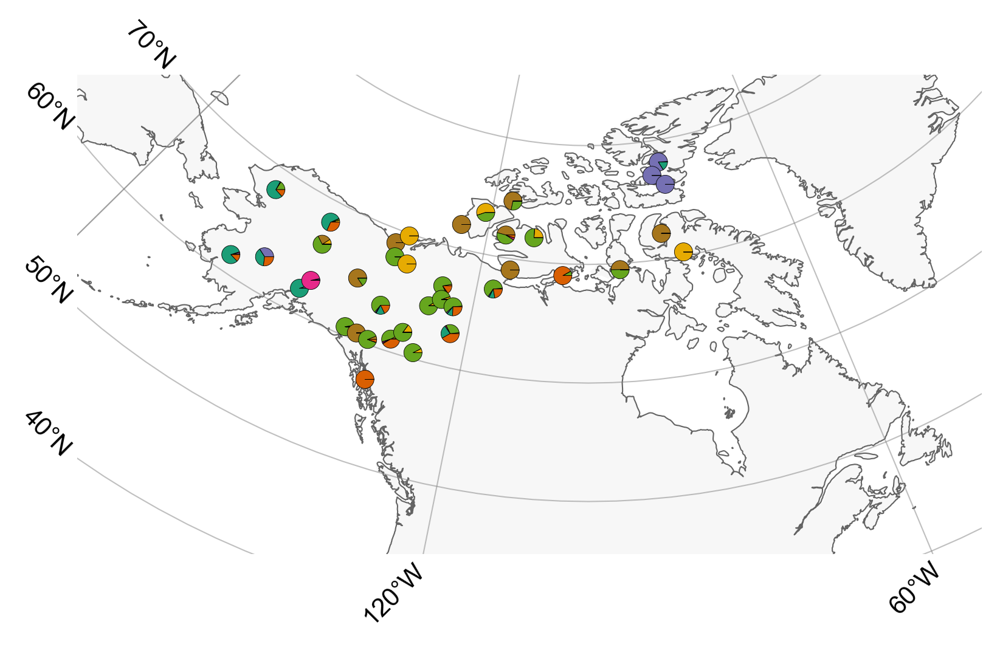

In [165]:
# edges: 980, 207, 621, 180, 185, 189, 585, 187, 390, 747, 815, 1206
from matplotlib import cm
projection = ccrs.EquidistantConic(central_longitude=-100, central_latitude=60)   
fig = plt.figure(dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, obj, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=10, 
        obs_node_size=7.5, sample_pt_color="black", obs_node_textsize=4, cbar_font_size=10, cbar_ticklabelsize=8)
v.draw_map(latlong=True); ax.set_extent([-160, -55, 38, 80]); #v.draw_obs_nodes(); v.draw_edges(use_weights=True); v.draw_edge_colorbar()
# fig.colorbar(cm.ScalarMappable(cmap=plt.get_cmap('Purples')), ax=v.ax, shrink=0.1, orientation='horizontal', values=np.linspace(0.5,2.5), location='top')
# for i in range(1207):
    # v.ax.plot(grid[np.where(permuted_idx==contour_df980['(source, dest.)'].iloc[i][0])[0][0],0],grid[np.where(permuted_idx==contour_df980['(source, dest.)'].iloc[i][0])[0][0],1],marker='$'+str(np.where(permuted_idx==contour_df980['(source, dest.)'].iloc[i][0])[0][0],)+'$',color='grey',alpha=0.8,markersize=4.5,transform=ccrs.EquidistantConic(central_longitude=grid[permuted_idx[i],0], central_latitude=grid[permuted_idx[i],1]),)
    # v.ax.plot(grid[permuted_idx[contour_df980['(source, dest.)'].iloc[i][0]],0],grid[permuted_idx[contour_df980['(source, dest.)'].iloc[i][0]],1],marker='$'+str(np.where(permuted_idx==contour_df980['(source, dest.)'].iloc[i][0])[0][0],)+'$',color='grey',alpha=0.8,markersize=4.5,transform=ccrs.EquidistantConic(central_longitude=grid[np.where(permuted_idx==contour_df980['(source, dest.)'].iloc[i][0])[0][0],0], central_latitude=grid[np.where(permuted_idx==contour_df980['(source, dest.)'].iloc[i][0])[0][0],1]),)
    # if i < wolves_graph.n_observed_nodes:
    #     v.ax.scatter(grid[permuted_idx[i],0],grid[permuted_idx[i],1],marker='s',edgecolors='grey',color=plt.get_cmap('Purples')((qdf.iat[i,1]-0.17)/2.4),alpha=1,s=20,transform=ccrs.EquidistantConic(central_longitude=grid[permuted_idx[i],0], central_latitude=grid[permuted_idx[i],1]),)
    # else:
    #     v.ax.plot(grid[permuted_idx[i],0],grid[permuted_idx[i],1],'o',color=plt.get_cmap('Purples')((qdf.iat[i,1]-0.17)/2.4),alpha=0.8,markersize=2.5,transform=ccrs.EquidistantConic(central_longitude=grid[permuted_idx[i],0], central_latitude=grid[permuted_idx[i],1]),)
# v.draw_obs_nodes(use_ids=False); #v.draw_edges(use_weights=True); v.draw_edge_colorbar(); 
# radius = 0.25; 
for i in permuted_idx[:wolves_graph.n_observed_nodes]:
        if i==1206:
                draw_admix_pie(Q_k7[wolves_graph.nodes[i]['sample_idx'][0], :], v.grid[i, 0], v.grid[i, 1], colors_k7, radius=radius, ax=ax)
        else:
                draw_admix_pie(Q_k7[wolves_graph.nodes[i]['sample_idx'][0], :], v.grid[i, 0], v.grid[i, 1], colors_k7, radius=radius, ax=ax)
# v.ax.plot(obs_grid[permuted_idx[:94]==180,0], obs_grid[permuted_idx[:94]==180,1], 'o', color='#e9a3c9', alpha=0.8, markersize=10, label='winter (Nov-Apr)')
# v.ax.plot(obs_grid[permuted_idx[:94]==207,0], obs_grid[permuted_idx[:94]==207,1], 'o', color='#999999', alpha=0.8, markersize=10, label='unspecified (no month mentioned)')
# v.ax.plot(obs_grid[permuted_idx[:94]==935,0], obs_grid[permuted_idx[:94]==935,1], 'o', color='#a1d76a', alpha=0.8, markersize=10, label='summer (May-Oct)')
# for ip, p in enumerate(permuted_idx[:94]):
#         for i in wolves_graph.nodes[p]['sample_idx']:
#                 if str(wolvesdate['date'].iloc[i])!='nan':
#                         # v.ax.plot(obs_grid[ip, 0], obs_grid[ip, 1], 'o', color=colormaps.get_cmap('cool').resampled(2006-1991+1)(int(float(wolvesdate['date'].iloc[i].split('-')[1])-1993)), alpha=0.8, markersize=9)
#                         if wolvesdate['date'].iloc[i].split('-')[0] != '00':
#                                 v.ax.plot(obs_grid[ip, 0], obs_grid[ip, 1], 'o', color=colormaps.get_cmap('summer').resampled(12)(int(wolvesdate['date'].iloc[i].split('-')[0])), alpha=0.8, markersize=9)
                        # if wolvesdate['date'].iloc[i].split('-')[0] in winter:
                        #         v.ax.plot(obs_grid[ip, 0], obs_grid[ip, 1], 'o', color='#e9a3c9', alpha=0.8, markersize=10)
                        # elif wolvesdate['date'].iloc[i].split('-')[0]=='00':
                        #         # v.ax.plot(obs_grid[ip, 0], obs_grid[ip, 1], 'o', color='#999999', alpha=0.8, markersize=10)
                        #         continue
                        # else:
                        #         v.ax.plot(obs_grid[ip, 0], obs_grid[ip, 1], 'o', color='#a1d76a', alpha=0.8, markersize=10)
# v.ax.legend(loc='upper left', fontsize=8) 
# fig.colorbar(cm.ScalarMappable(cmap=colormaps.get_cmap('cool').resampled(2006-1993+1)), ax=v.ax, shrink=0.4, values=range(1991,2007), label='year of sampling', location='top', orientation='horizontal') 
# cb = fig.colorbar(cm.ScalarMappable(cmap=colormaps.get_cmap('summer').resampled(12)), values=range(12), ax=v.ax, shrink=0.4,label='month of sampling', location='top', orientation='horizontal')
# cb.set_ticks(np.array([2,5,8,11],dtype='int'), labels=['Mar','Jun','Sep','Dec'])
v.draw_c_colorbar()
for e in [980, 207, 621, 180, 585, 402, 187, 390, 747, 815]:
#         # v.ax.plot(obs_grid[np.where(permuted_idx == e)[0], 0], obs_grid[np.where(permuted_idx == e)[0], 1], 'ro', markersize=3, alpha=0.5,)# transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == e)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == e)[0], 1][0]))
        pe = contour_dict[e]['(source, dest.)'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])]
        # v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],1.,lw=1.66,hw=1e5,hl=1e5,mode='unsampled',fs=0)
        # v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],contour_dict[e]['admix. prop.'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])],lw=.5,hw=1e5,hl=1e5,mode='unsampled',fs=0)
        v.draw_arrow([(pe[0],permuted_idx[pe[1]])],contour_dict[e]['admix. prop.'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])])
for e in [1206]:
        pe = contour_dict[e]['(source, dest.)'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])]
        v.draw_arrow([(pe[0],1206)],contour_dict[e]['admix. prop.'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])])
# for idx, i in enumerate(np.argsort(outliers_df['pval'])[:5]):
#     v.draw_arrow([(np.where(permuted_idx==outliers_df['dest.'].iloc[i])[0][0],np.where(permuted_idx==outliers_df['source'].iloc[i])[0][0])],.6,lw=0.4,hw=0,hl=0,mode='sampled',fs=0)
#     v.ax.text(
#         np.mean([obs_grid[np.where(permuted_idx==outliers_df['source'].iloc[i])[0][0], 0],obs_grid[np.where(permuted_idx==outliers_df['dest.'].iloc[i])[0][0], 0]]),
#         np.mean([obs_grid[np.where(permuted_idx==outliers_df['source'].iloc[i])[0][0], 1],obs_grid[np.where(permuted_idx==outliers_df['dest.'].iloc[i])[0][0], 1]]),
#         # str("{:d}, ({:.1e})".format(idx+1,outliers_df['pval'].iloc[i])),
#         str("{:d}".format(idx+1)),
#         horizontalalignment="center",
#         verticalalignment="center",
#         size=6, color='dodgerblue'
#     )

In [51]:
# contour_dict[1206]['scaled log-lik'].iloc[np.argmax(contour_dict[1206]['scaled log-lik'])]
# pe = contour_dict[189]['(source, dest.)'].iloc[np.argmax(contour_dict[189]['scaled log-lik'])]
# Q_k7[wolves_graph.nodes[187]['sample_idx'][0], :]
# [(wolvesdate['iid'].iloc[i],float(wolvesdate['date'].iloc[i].split('-')[1])) for i in np.where(~pd.isna(wolvesdate['date']))[0]]
# wolves_graph.nodes[585]
# np.argsort(outliers_df['pval'])
# colormaps.get_cmap('cool').resampled(2006-1993+1)
# plt.hist(qdf['q'].iloc[94:],bins=10); plt.axvline(0.2,color='red'); plt.axvline(2.5,color='red')


(711, 89)

### Running a PCA on the demes from FEEMS

In [53]:
# [str(poporder.loc[w==poporder['id']]['id'].values[0]) for w in wolves_graph.assned_node_idx].index('1206')

980

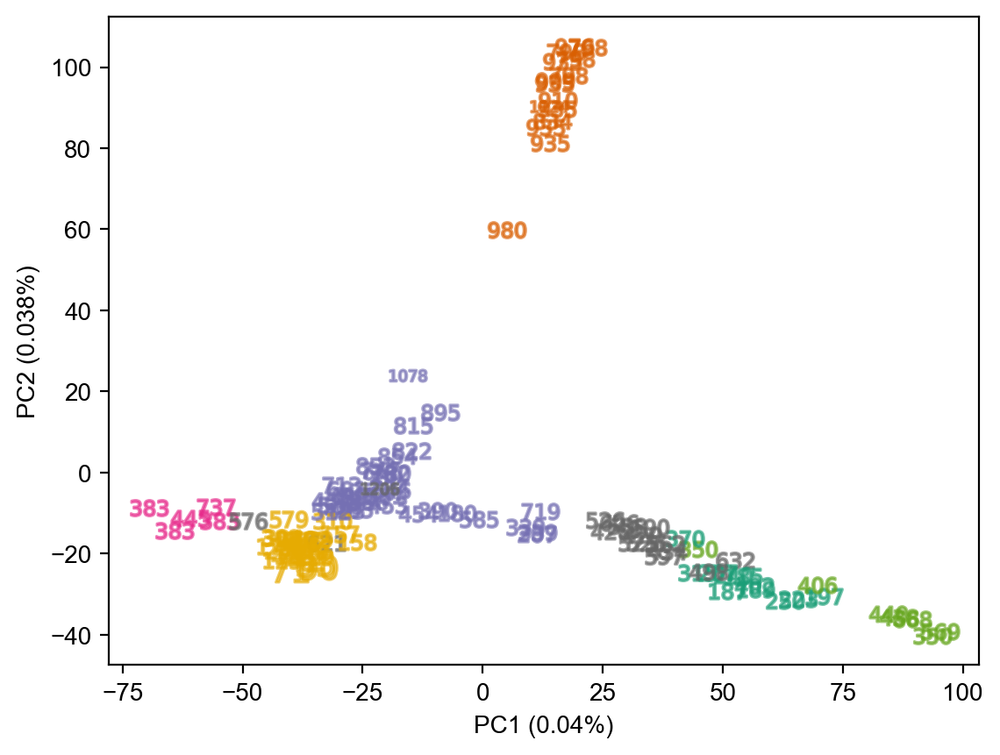

In [679]:
# import allel
# poporder = pd.read_csv('/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/poporder.txt',sep=' ',header=None,names=['id','col'])

# gn = np.zeros((wolves_graph.n_snps,wolves_graph.n_observed_nodes))
# for i, node_id in enumerate(permuted_idx[:wolves_graph.n_observed_nodes]):
#     s = sample_idx[node_id]

#     allele_counts = np.sum(wolves_graph.genotypes[s, :], axis=0)
#     gn[:,i] = allele_counts

# pcacoord, mod = allel.pca(wolves_graph.genotypes.T, n_components=10)
# cols = [str(poporder.loc[w==poporder['id']]['col'].values[0]) for w in wolves_graph.assned_node_idx]
fig = plt.figure(dpi=200)
for i in range(wolves_graph.genotypes.shape[0]):
    plt.scatter(pcacoord[i,0],pcacoord[i,1],s=250,marker='$'+str(poporder.loc[wolves_graph.assned_node_idx[i]==poporder['id']]['id'].values[0])+'$',c=cols[i],alpha=0.6)
plt.xlabel('PC1 (0.04%)'); plt.ylabel('PC2 (0.038%)'); 

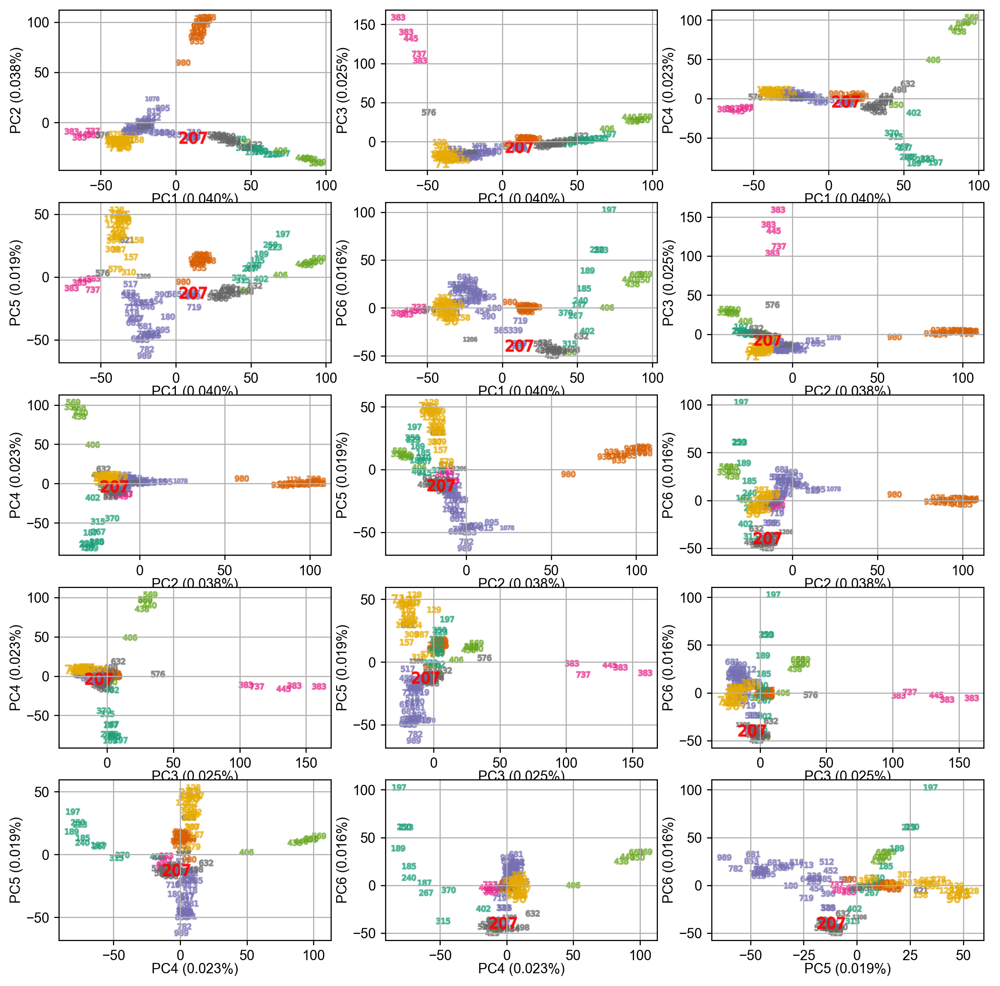

In [810]:
# from matplotlib import gridspec

deme = str(207)
idx = [str(poporder.loc[w==poporder['id']]['id'].values[0]) for w in wolves_graph.assned_node_idx].index(deme)

fig = plt.figure(dpi=250,figsize=(12,12))
plt.subplots_adjust(left=None, bottom=.1, right=None, top=None, wspace=None, hspace=.2)
for n, ticks in enumerate(list(it.combinations(range(6),2))):
    ax_00 = plt.subplot(5, 3, n + 1)
    ax_00.scatter(pcacoord[idx,ticks[0]],pcacoord[idx,ticks[1]],s=400,marker='$'+deme+'$',c='r',alpha=0.8); 
    for i in range(wolves_graph.genotypes.shape[0]):
        ax_00.scatter(pcacoord[i,ticks[0]],pcacoord[i,ticks[1]],s=100,marker='$'+str(poporder.loc[wolves_graph.assned_node_idx[i]==poporder['id']]['id'].values[0])+'$',c=cols[i],alpha=0.6)
    ax_00.set_xlabel('PC{:d} ({:.3f}%)'.format(ticks[0]+1,mod.explained_variance_ratio_[ticks[0]]),labelpad=0); ax_00.set_ylabel('PC{:d} ({:.3f}%)'.format(ticks[1]+1,mod.explained_variance_ratio_[ticks[1]]),labelpad=2); ax_00.grid()

In [67]:
# plt.hist(res.resid,15); 
# max_res_node = []; pval = []
# for k in np.where(res.resid<sp.stats.norm.ppf(0.001,loc=0,scale=np.std(res.resid)))[0]:
#     x = np.floor(np.sqrt(2*k+0.25)-0.5).astype('int')+1
#     y = int(k - 0.5*x*(x-1))
#     max_res_node.append(sorted((x,y)))
#     pval.append(sp.stats.norm.cdf(res.resid[k],loc=0,scale=np.std(res.resid)))

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, 
#         edge_alpha=1, edge_zorder=100, sample_pt_size=10, 
#         obs_node_size=7.5, sample_pt_color="black", 
#         cbar_font_size=10)
# v.draw_map(latlong=False); v.draw_samples(); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# obs_grid = v.grid[query_node_attributes(wolves_graph, "permuted_idx")[:wolves_graph.n_observed_nodes],:]
# for ij, j in enumerate(np.unique(np.array(max_res_node)[:,1])):
#     for i in np.where(np.array(max_res_node)[:,1]==j)[0]:
#         v.ax.plot(
#             [obs_grid[max_res_node[i][0], 0],obs_grid[max_res_node[i][1],0]],
#             [obs_grid[max_res_node[i][0], 1],obs_grid[max_res_node[i][1],1]],
#             color = 'grey', linewidth = 0.2, alpha=0.95, ls='-.'
#         )
#         v.ax.text(
#             np.mean([obs_grid[max_res_node[i][0], 0],obs_grid[max_res_node[i][1], 0]]),
#             np.mean([obs_grid[max_res_node[i][0], 1],obs_grid[max_res_node[i][1], 1]]),
#             str("{:.1e}".format(pval[i])),
#             horizontalalignment="left",
#             verticalalignment="center",
#             size=v.obs_node_textsize*0.6
#         )

In [57]:
os.chdir('/Users/vivaswatshastry/src/feems/feems/data/wolves/')
Q_k2 = np.loadtxt("wolvesadmix.2.Q")
Q_k3 = np.loadtxt("wolvesadmix.3.Q")
Q_k4 = np.loadtxt("wolvesadmix.4.Q")
Q_k5 = np.loadtxt("wolvesadmix.5.Q")
Q_k6 = np.loadtxt("wolvesadmix.6.Q")
Q_k7 = np.loadtxt("wolvesadmix.7.Q")
Q_k8 = np.loadtxt("wolvesadmix.8.Q")

#################### colors ####################
colors_k2 = ["#1b9e77", "#d95f02"] # x
colors_k3 = ["#1b9e77", "#d95f02", "#7570b3"] # x
colors_k4 = ["#7570b3", "#e7298a", "#d95f02", "#1b9e77"] # x
colors_k5 = ["#e7298a", "#66a61e", "#d95f02", "#1b9e77", "#7570b3"] # x 
colors_k6 = ["#1b9e77", "#e7298a", "#7570b3", "#e6ab02", "#d95f02", "#66a61e"] # x
colors_k7 = ["#e6ab02", "#a6761d", "#66a61e", "#7570b3", "#e7298a", "#1b9e77", "#d95f02"] # x 
colors_k8 = ["#1b9e77", "#e6ab02", "#d95f02", "#66a61e", "#666666", "#a6761d", "#7570b3", "#e7298a"] # x

In [61]:
from matplotlib import gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
def draw_admix_pie(admix_fracs, 
                   x, y, 
                   colors,
                   radius=.18, 
                   inset_width=.5,
                   inset_height=.5,
                   loc=10,
                   linewidth=.2,
                   edgecolor="black",
                   ax=None):
    """Draws a single admixture pie on a axis
    """
    xy = (x, y)
    ax_i = inset_axes(ax, 
                      width=inset_width, 
                      height=inset_height, 
                      loc=loc, 
                      bbox_to_anchor=(x, y),
                      bbox_transform=ax.transData, 
                      borderpad=0)
    wedges, t = ax_i.pie(admix_fracs, 
                         colors=colors, 
                         center=xy, 
                         radius=radius, 
                         wedgeprops={"linewidth": linewidth, 
                                     "edgecolor": edgecolor})

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: i

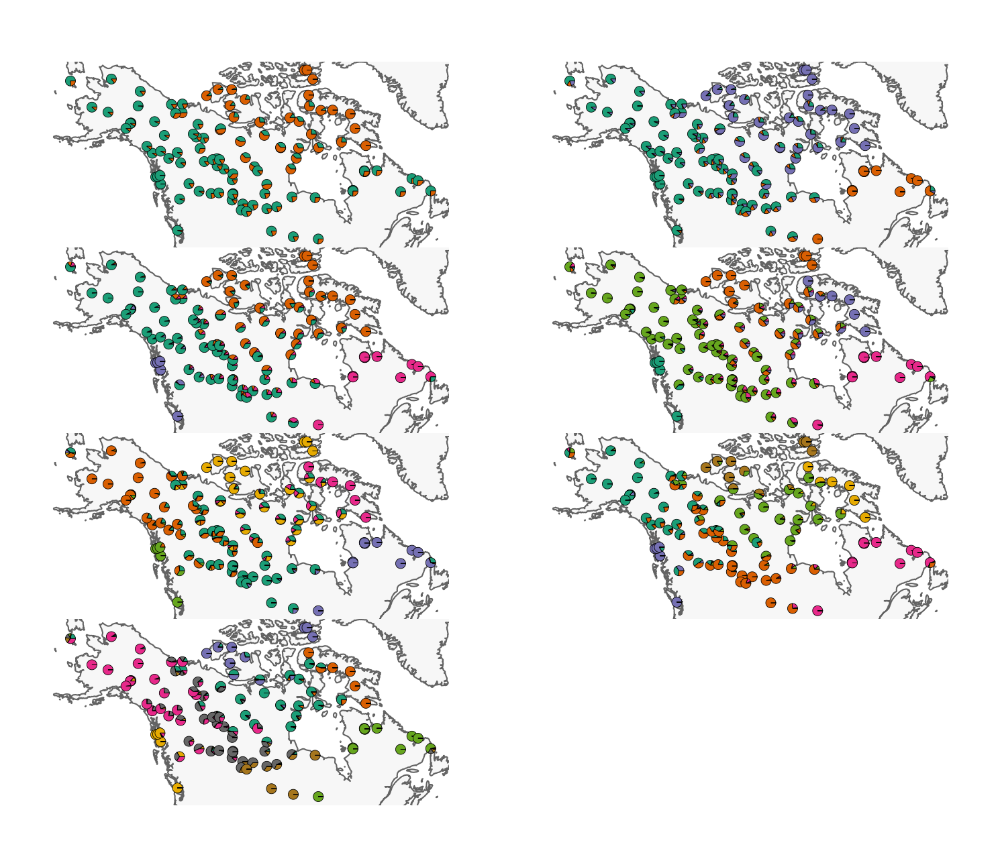

In [336]:
# from matplotlib import gridspec
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# n, p = wolves_graph.genotypes.shape
# radius = 0.125; title_pad = -10; title_loc = "left"
# fig = plt.figure(dpi=300)
# spec = gridspec.GridSpec(ncols=2, nrows=4, figure=fig, wspace=0.0, hspace=0.0)

# #################### axis 00 ####################
# ax_00 = fig.add_subplot(spec[0, 0], projection=projection)
# # ax_00.set_title("K=2", loc=title_loc, pad=title_pad)
# v = Viz(ax_00, wolves_graph, projection=projection)
# v.draw_map(latlong=False)
# ax_00.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0.0)
# for i in range(n):
#     draw_admix_pie(Q_k2[i, :], 
#                    v.coord[i, 0], 
#                    v.coord[i, 1], 
#                    colors_k2, 
#                    radius=radius,
#                    ax=ax_00)
    
# #################### axis 01 ####################
# ax_01 = fig.add_subplot(spec[0, 1], projection=projection)
# # ax_01.set_title("K=3", loc=title_loc, pad=title_pad)
# v = Viz(ax_01, wolves_graph, projection=projection)
# v.draw_map(latlong=False)
# ax_01.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0)
# for i in range(n):
#     draw_admix_pie(Q_k3[i, :], 
#                    v.coord[i, 0], 
#                    v.coord[i, 1], 
#                    colors_k3, 
#                    radius=radius,
#                    ax=ax_01)

# #################### axis 10 ####################
# ax_10 = fig.add_subplot(spec[1, 0], projection=projection)
# # ax_10.set_title("K=4", loc=title_loc, pad=title_pad)
# v = Viz(ax_10, wolves_graph, projection=projection)
# v.draw_map(latlong=False)
# ax_10.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0)
# for i in range(n):
#     draw_admix_pie(Q_k4[i, :], 
#                    v.coord[i, 0], 
#                    v.coord[i, 1], 
#                    colors_k4, 
#                    radius=radius,
#                    ax=ax_10)

# #################### axis 11 ####################
# ax_11 = fig.add_subplot(spec[1, 1], projection=projection)
# # ax_11.set_title("K=5", loc=title_loc, pad=title_pad)
# v = Viz(ax_11, wolves_graph, projection=projection)
# v.draw_map(latlong=False)
# ax_11.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0)
# for i in range(n):
#     draw_admix_pie(Q_k5[i, :], 
#                    v.coord[i, 0], 
#                    v.coord[i, 1], 
#                    colors_k5, 
#                    radius=radius,
#                    ax=ax_11)

# #################### axis 20 ####################
# ax_20 = fig.add_subplot(spec[2, 0], projection=projection)
# # ax_20.set_title("K=6", loc=title_loc, pad=title_pad)
# v = Viz(ax_20, wolves_graph, projection=projection)
# v.draw_map(latlong=False)
# ax_20.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0)
# for i in range(n):
#     draw_admix_pie(Q_k6[i, :], 
#                    v.coord[i, 0], 
#                    v.coord[i, 1], 
#                    colors_k6, 
#                    radius=radius,
#                    ax=ax_20)

# #################### axis 21 ####################
# ax_21 = fig.add_subplot(spec[2, 1], projection=projection)
# # ax_21.set_title("K=7", loc=title_loc, pad=title_pad)
# v = Viz(ax_21, wolves_graph, projection=projection)
# v.draw_map(latlong=False)
# ax_21.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0)
# for i in range(n):
#     draw_admix_pie(Q_k7[i, :], 
#                    v.coord[i, 0], 
#                    v.coord[i, 1], 
#                    colors_k7, 
#                    radius=radius,
#                    ax=ax_21)

# #################### axis 30 ####################
# ax_30 = fig.add_subplot(spec[3, 0], projection=projection)
# # ax_30.set_title("K=8", loc=title_loc, pad=title_pad)
# v = Viz(ax_30, wolves_graph, projection=projection)
# v.draw_map(latlong=False)
# ax_30.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0)
# for i in range(n):
#     draw_admix_pie(Q_k8[i, :], 
#                    v.coord[i, 0], 
#                    v.coord[i, 1], 
#                    colors_k8, 
#                    radius=radius,
#                    ax=ax_30)

In [1133]:
permuted_idx = query_node_attributes(wolves_graph, "permuted_idx")
qdf = pd.DataFrame(columns=['loc','q'],index=range(1207))
for i in range(1207):
    qdf.iat[i,0] = permuted_idx[i]
    if i < wolves_graph.n_observed_nodes:
        qdf.iat[i,1] = 1/wolves_graph.q[i]
    else:
        R1 = -2*obj.Lpinv[:obj.sp_graph.n_observed_nodes,i].T + np.diag(obj.Linv) + obj.Lpinv[i,i]
        # qdf.iat[i,1] = np.ravel(np.dot(1/wolves_graph.q, np.exp(-R1.T)))[0] # -> produces egregiously high values
        # qdf.iat[i,1] = 1/wolves_graph.q[np.argmin(R1)]*np.exp(-2*np.min(R1))
        # qdf.iat[i,1] = np.ravel(np.dot(1/wolves_graph.q, (1/R1.T)/np.sum(1/R1)))[0] #-> using dist. to all sampled demes
        topidx = np.argsort(R1)[0,:1] 
        qdf.iat[i,1] = np.ravel(np.dot(1/wolves_graph.q[topidx], (1/R1[0,topidx].T)/np.sum((1/R1[0,topidx]))))[0]
        # qdf.iat[i,1] = 1/wolves_graph.q[np.argmin(R1)]

## computing resmat for an unsampled source and comparing to resmat from a sampled source
# Rmat = -2*obj.Linv[:94,:94] + np.reshape(np.diag(obj.Linv),(1,-1)).T @ np.ones((wolves_graph.n_observed_nodes,1)).T + np.ones((wolves_graph.n_observed_nodes,1)) @ np.reshape(np.diag(obj.Linv),(1,-1))
# Q1mat = np.ones((wolves_graph.n_observed_nodes,1)) @ wolves_graph.q_inv_diag.diagonal().reshape(1,-1)
# resmat = Rmat + (Q1mat + Q1mat.T) - 2*wolves_graph.q_inv_diag

# resmatc = deepcopy(resmat); c = 0.5

# lrn = [(66,89)]

# resmatc[lrn[0][0],lrn[0][1]] = (0.5*c**2-1.5*c+1)*Rmat[lrn[0][0],lrn[0][1]] + (1+c)/wolves_graph.q[lrn[0][0]] + (1-c)/wolves_graph.q[lrn[0][1]]
# resmatc[lrn[0][1],lrn[0][0]] = resmatc[lrn[0][0],lrn[0][1]]

# ## id
# for i in set(range(wolves_graph.n_observed_nodes))-set([lrn[0][0],lrn[0][1]]):
#     resmatc[i,lrn[0][1]] = (1-c)*(Rmat[i,lrn[0][1]]) + c*Rmat[i,lrn[0][0]] + 0.5*(c**2-c)*Rmat[lrn[0][0],lrn[0][1]] + 1/wolves_graph.q[i] + (1-c)/wolves_graph.q[lrn[0][1]] + c/wolves_graph.q[lrn[0][0]]
#     resmatc[lrn[0][1],i] = resmatc[i,lrn[0][1]]

# resmat1 = deepcopy(resmat); c = 0.5

# lrn = [(673,89)]

# R1d = -2*obj.Linv[lrn[0][0],lrn[0][1]] + obj.Lpinv[lrn[0][0],lrn[0][0]] + obj.Linv[lrn[0][1],lrn[0][1]]
# R1 = -2*obj.Lpinv[:obj.sp_graph.n_observed_nodes,lrn[0][0]].T + np.diag(obj.Linv) + obj.Lpinv[lrn[0][0],lrn[0][0]]
# one = np.argmin(R1)
# resmat1[one,lrn[0][1]] = (0.5*c**2-1.5*c+1)*Rmat[one,lrn[0][1]] + (1-c)/obj.sp_graph.q[lrn[0][1]] + (1+c)*np.ravel(np.dot(1/wolves_graph.q, (1/R1.T)/np.sum(1/R1)))[0] 
# resmat1[lrn[0][1],one] = resmat1[one,lrn[0][1]]

# R1 = -2*obj.Lpinv[:obj.sp_graph.n_observed_nodes,lrn[0][0]].T + np.diag(obj.Linv) + obj.Lpinv[lrn[0][0],lrn[0][0]]
# topidx = np.ravel(np.argsort(R1[0,:])[0,:1]).tolist()
# q1 = np.dot(1/obj.sp_graph.q[topidx], (1/R1[0,topidx].T)/np.sum(1/R1[0,topidx]))

# for it in topidx:
#         resmat1[it,lrn[0][1]] = Rmat[it,lrn[0][1]] + 0.5*(c**2-c)*R1[0,lrn[0][1]] + (1+c)/obj.sp_graph.q[lrn[0][1]] - c*q1 + 1/obj.sp_graph.q[it]
#         resmat1[lrn[0][1],it] = resmat1[it,lrn[0][1]]   
# for i in set(range(obj.sp_graph.n_observed_nodes))-set(topidx+[lrn[0][1]]):
#         resmat1[i,lrn[0][1]] = (0.5*c**2-1.5*c+1)*Rmat[i,lrn[0][1]] + (1+c)/obj.sp_graph.q[i] + (1-c)/obj.sp_graph.q[lrn[0][1]]
#         # resmat1[i,lrn[0][1]] = (1-c)*Rmat[i,lrn[0][1]] + c*R1[0,i] + 0.5*(c**2-c)*R1[0,lrn[0][1]] + 1/obj.sp_graph.q[i] + (1-c)/obj.sp_graph.q[lrn[0][1]] + c*q1
#         resmat1[lrn[0][1],i] = resmat1[i,lrn[0][1]]

# resmat1[one,lrn[0][1]] = (1-c)*Rmat[one,lrn[0][1]] + 0.5*(c**2-c)*R1d + (1+c)/obj.sp_graph.q[lrn[0][1]] + (1-c)/obj.sp_graph.q[one] 
# resmat1[one,lrn[0][1]] = (0.5*c**2-1.5*c+1)*Rmat[one,lrn[0][1]] + (1-c)/obj.sp_graph.q[lrn[0][1]] + (1+c)/obj.sp_graph.q[one]

# for i in set(range(obj.sp_graph.n_observed_nodes))-set([lrn[0][1]]):
#         resmat1[i,lrn[0][1]] = (1-c)*Rmat[i,lrn[0][1]] + c*Rmat[i,one] + 0.5*(c**2-c)*R1d + 1/obj.sp_graph.q[i] + (1-c)/obj.sp_graph.q[lrn[0][1]] + c/obj.sp_graph.q[one]
#         resmat1[lrn[0][1],i] = resmat1[i,lrn[0][1]]

# plt.imshow(resmatc-resmat1,cmap='RdBu'); plt.colorbar()
# resmatc[72,89], resmat1[72,89]

# D = np.ones(obj.sp_graph.n_observed_nodes).reshape(-1,1) @ np.diag(obj.sp_graph.S).reshape(1,-1) + np.diag(obj.sp_graph.S).reshape(-1,1) @ np.ones(obj.sp_graph.n_observed_nodes).reshape(1,-1) - 2*obj.sp_graph.S

# -sp.stats.wishart.logpdf(-obj.sp_graph.n_snps*obj.C @ D @ obj.C.T, obj.sp_graph.n_snps, -obj.C @ resmatc @ obj.C.T), -sp.stats.wishart.logpdf(-obj.sp_graph.n_snps*obj.C @ D @ obj.C.T, obj.sp_graph.n_snps, -obj.C @ resmat1 @ obj.C.T)

In [1138]:
# obj.neg_log_lik_c(0.5,{'lre':[(741,89)],'mode':'unsampled'})
# (1/R1[0,70].T)/np.sum(1/R1[0,topidx])
# lrn = [(741,89)]
# set([(np.ravel(topidx.tolist())),lrn[0][1]])
# R1 = -2*obj.Lpinv[lrn[0][0],:obj.sp_graph.n_observed_nodes] + np.diag(obj.Linv) + obj.Lpinv[lrn[0][0],lrn[0][0]]
# R1 = -2*obj.Lpinv[:obj.sp_graph.n_observed_nodes,lrn[0][0]].T + np.diag(obj.Linv) + obj.Lpinv[lrn[0][0],lrn[0][0]]
# topidx = np.ravel(np.argsort(R1[0,:])[0,:1]).tolist()
# plt.plot(np.linspace(0,2,20),3.2*np.exp(-0.5*np.linspace(0,2,20)),color=plt.get_cmap('Blues',4)(1),label='0.5')
# plt.plot(np.linspace(0,2,20),3.2*np.exp(-np.linspace(0,2,20)),color=plt.get_cmap('Blues',4)(2),label='1')
# plt.plot(np.linspace(0,2,20),3.2*np.exp(-2*np.linspace(0,2,20)),color=plt.get_cmap('Blues',4)(3),label='2')
# plt.legend(title=r'$\lambda$')
# np.dot(1/wolves_graph.q,np.exp(-R1.T))
# np.dot(1/wolves_graph.q[:3],np.exp(-2*R1[0,:3]).T)
# np.argsort(R1)[0,:1], np.argmin(R1)

3.0203401371269236

In [22]:
# plt.hist(wolves_graph.L[:,711].todense())
# np.dot(wolves_graph.W[:94,720].T.todense(),wolves_graph.q), wolves_graph.q[72]
# obj.Rmat = -2*obj.Lpinv + np.broadcast_to(np.diag(obj.Lpinv),(obj.Lpinv.shape[0],obj.Lpinv.shape[0])).T + np.broadcast_to(np.diag(obj.Lpinv),(obj.Lpinv.shape[0],obj.Lpinv.shape[0]))
# R1 = -2*obj.Lpinv[:obj.sp_graph.n_observed_nodes,342].T + np.diag(obj.Linv) + obj.Lpinv[342,342]
# np.dot(1/wolves_graph.q, R1.T/np.sum(R1)), 1/wolves_graph.q[1]
# np.where(permuted_idx==43)[0]
# plt.plot(1/wolves_graph.q[:93],np.ravel([np.dot(1/wolves_graph.q,obj.Rmat[:94,permuted_idx[i]+1]/np.sum(obj.Rmat[:94,permuted_idx[i]+1])) for i in range(93)]),'ko')
# plt.plot(obj.Rmat[:94,740]/np.sum(obj.Rmat[:94,740]),'ko'); #plt.axvline(72,color='red'); plt.axhline(1/wolves_graph.q[72],color='grey')
# np.dot(1/wolves_graph.q,obj.Rmat[:94,740]/np.sum(obj.Rmat[:94,740])), 1/wolves_graph.q[72]
# np.mean(wolves_graph.q)

In [41]:
## basically how do I get the closest sampled deme and path? -> get it from Lpinv
## but some Lpinv entries are negative so need to be careful with how you normalize (should I use L instead?)
# plt.plot(range(1207),obj.Lpinv[711,].T,'ko')
# (np.argpartition(obj.Lpinv[:wolves_graph.n_observed_nodes,711].T,-3)[0,-3:]).tolist()[0]
# obj.Lpinv[[64,70,72],711]/np.sum(obj.Lpinv[[64,70,72],711])
# np.sum((1/wolves_graph.q) * obj.Lpinv[:94,718]/np.sum(obj.Lpinv[:94,718])), 1/wolves_graph.q[72]
# plt.hist(contour_df980['scaled log-lik'],100);
# np.dot(1/wolves_graph.q[neighs], (obj.Lpinv[[64,70,72],711]/np.sum(obj.Lpinv[[64,70,72],711])))
# sp.optimize.minimize(obj.neg_log_lik_c, x0=0.5, bounds=[(0,1)], tol=1e-8, method='L-BFGS-B', args={'lre':[(84,89)],'mode':'sampled'})
# contour_dict[980].iloc[617]
# totweight = np.sum(obj.Lpinv[[64,70,72],711])
# (1/obj.sp_graph.q[64]*obj.Lpinv[64,711]/totweight)
# [k for k, v in nx.get_node_attributes(self.sp_graph,'permuted_idx').items() if v==s][0]
# sp.optimize.minimize(obj.neg_log_lik_c, x0=0.9, bounds=[(0,1)], tol=1e-8, method='Nelder-Mead', args={'lre':[(647,89)],'mode':'unsampled'})
# contour_df980.iloc[np.argmax(contour_df980['scaled log-lik'])]
# contour_df980['(source, dest.)'].iloc[np.argmax(contour_df980['scaled log-lik'])]
# plt.plot(np.linspace(0,1,40),[-obj.neg_log_lik_c(c,{'lre':[(66,89)],'mode':'sampled'}) for c in np.linspace(0,1,40)],'-ko')
# [(np.where(permuted_idx==contour_df980['(source, dest.)'].iloc[contour_df980['scaled log-lik'].argmax()][0])[0][0],contour_df980['(source, dest.)'].iloc[contour_df980['scaled log-lik'].argmax()][1])]
# cgrid = np.linspace(0,1,40)
# cprofll2 = np.zeros((np.sum(contour_df980['scaled log-lik']>-2),len(cgrid)))
# for id, ed in enumerate(contour_df980['(source, dest.)'].loc[contour_df980['scaled log-lik']>-2]):
#     src = ed[0]
#     lre = [(np.where(permuted_idx==ed[0])[0][0],np.where(permuted_idx==ed[1])[0][0])]
#     psrc = np.where(permuted_idx==src)[0]
#     print(lre)
#     if psrc<wolves_graph.n_observed_nodes:
#         mode = 'sampled'
#     else:
#         mode = 'unsampled'
#     for ic, c in enumerate(cgrid):
#         try:
#             cprofll2[id,ic] = -obj.neg_log_lik_c(c, {'lre':lre, 'mode':mode})
#         except:
#             cprofll2[id,ic] = np.nan
# cprofll = [-obj.neg_log_lik_c(c,{'lre':[(66,89)],'mode':'sampled'}) for c in np.linspace(0,1,40)]
# np.linspace(0,1,40)[np.argmin(np.abs(cprofll-(np.nanmax(cprofll)-5)))], np.linspace(0,1,40)[np.argmin((np.nanmax(cprofll)-5)-cprofll)]
# cprofll-(np.nanmax(cprofll)-5)
# np.nanmax(cprofll)-cprofll
# np.linspace(0,1,40)[cprofll <= np.nanmax(cprofll) - 5]
# plt.plot(cgrid,cprofll,color='grey'); plt.ylim((np.nanmax(cprofll)-100,np.nanmax(cprofll)+.5)); plt.grid()
# plt.plot(cgrid,cprofll2.T,color='grey',alpha=0.3)
# plt.hist(1/wolves_graph.q,bins=20); plt.axvline(1/wolves_graph.q[np.where(permuted_idx==737)[0]])
# contour_df980['(source, dest.)'].iloc[np.argmax(contour_df980['scaled log-lik'])]

Object `inset_axes` not found.


/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

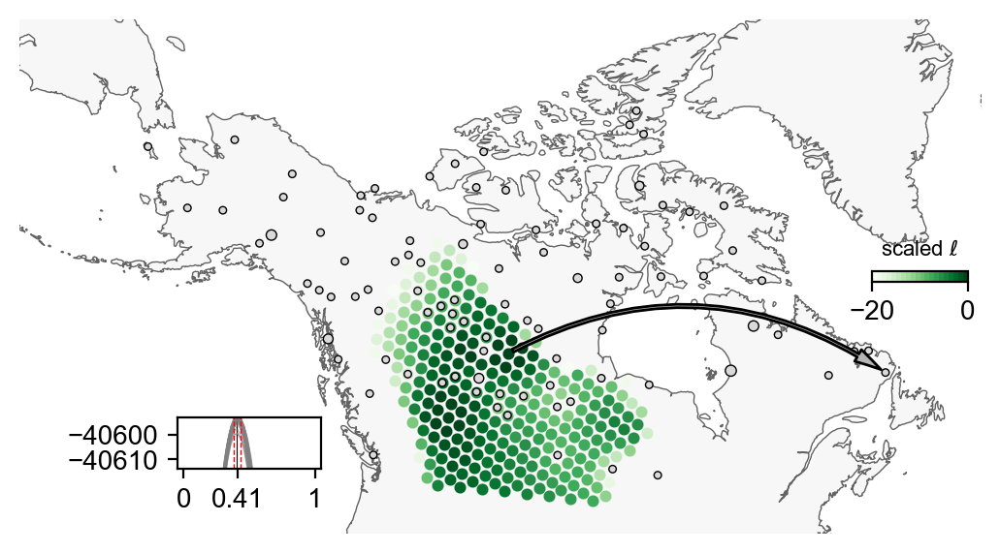

In [108]:
# contour_df980 = obj.calc_contour(destid=980, search_area='all')
# contour_df980 = contour_df980.drop(np.where(np.isnan(contour_df980['scaled log-lik']))[0]+1)
# contour_dict[980] = contour_dict[980].drop(np.where(np.isnan(contour_dict[980]['scaled log-lik']))[0]+1)

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,
#         obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df980,levels=1,ll_thresh=-3)
# v.ax.plot(obs_grid[np.where(permuted_idx == 980)[0], 0], obs_grid[np.where(permuted_idx == 980)[0], 1], 'ro', markersize=10, alpha=0.5)

# e = 980
fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection);  ax.set_extent([-160, -55, 37, 80])
v = Viz(ax, wolves_graph, obj, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5, obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=[[50,60],[-140,-120,-100,-80,-60]]); 
v.draw_map(latlong=False)
v.draw_arrow([(651,980)],0.4)
v.draw_ll_contour(contour_df980,levels=[-20,0]); v.draw_obs_nodes(use_ids=False)
# pe = contour_dict[e]['(source, dest.)'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])]
# v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],1.,lw=1.66,hw=0.8e5,hl=.8e5,mode='unsampled',fs=0)
# v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],contour_dict[e]['admix. prop.'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])],lw=.5,hw=.8e5,hl=.8e5,mode='unsampled',fs=2)
# v.draw_arrow([(46,89)],1.,lw=1.66,hw=0.8e5,hl=.8e5,mode='sampled',fs=0)
# v.draw_arrow([(46,89)],0.38,lw=.5,hw=.8e5,hl=.8e5,mode='sampled',fs=10)

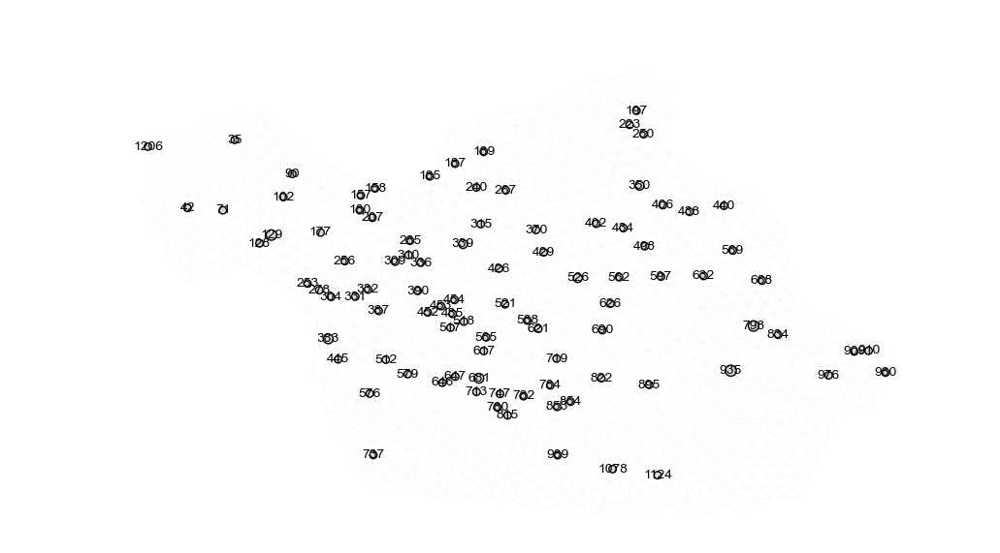

In [870]:
# contour_df980 = obj.calc_contour(destpid=980, sourcepid=453, search_area='radius', opts=3)

# contour_df980
# (np.where(permuted_idx==681)[0][0], np.where(permuted_idx==980)[0][0])
# sp.optimize.minimize(obj.neg_log_lik_c,x0=0.2, bounds=[(0,1)], method='L-BFGS-B', args={'lre':[(69,89)],'mode':'sampled'})

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection);  ax.set_extent([-160, -55, 37, 80])
# v = Viz(ax, wolves_graph, obj, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,
#         obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=[[50,60],[-140,-120,-100,-80,-60]]); 
# v.draw_obs_nodes(); v.draw_obs_nodes(use_ids=True); v.draw_edges(use_weights=True)
# pe = contour_df980['(source, dest.)'].iloc[np.argmax(contour_df980['scaled log-lik'])]
# v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],np.where(permuted_idx==pe[1])[0][0])],1.,lw=1.66,hw=0.8e5,hl=.8e5,mode='unsampled',fs=0)
# v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],np.where(permuted_idx==pe[1])[0][0])],contour_df980['admix. prop.'].iloc[np.argmax(contour_df980['scaled log-lik'])],lw=.5,hw=.8e5,hl=.8e5,mode='unsampled',fs=2)

array([1.19693103, 1.19693247, 1.19590599, ..., 1.19721153, 1.1971937 ,
       1.18544764])

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

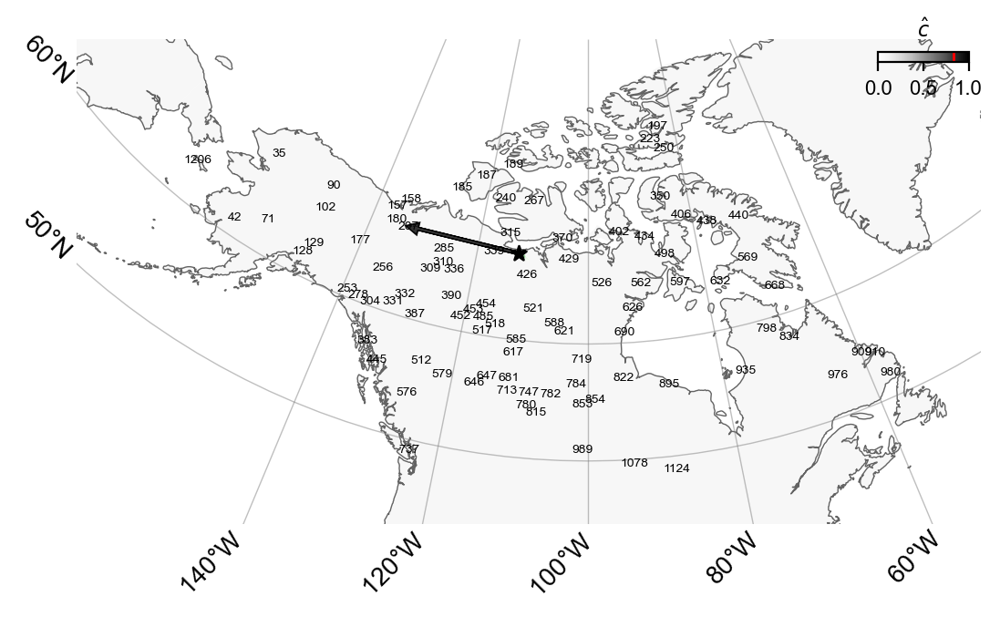

In [808]:
# contour_df207 = obj.calc_contour(destpid=207, search_area='all')
# contour_df207 = contour_df207.drop(np.where(np.isnan(contour_df207['scaled log-lik']))[0]+1)
# plt.hist(contour_df207['admix. prop.'],bins=20)

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,
#         obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df207,levels=[0,0.1,0.25,0.5,1])
# v.ax.plot(obs_grid[np.where(permuted_idx == 207)[0], 0], obs_grid[np.where(permuted_idx == 207)[0], 1], 'ro', markersize=10, alpha=0.5)

e = 207
fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection);  ax.set_extent([-160, -55, 37, 80])
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,
        obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80,-60]]); v.draw_obs_nodes(use_ids=True); 
v.draw_ll_contour(contour_dict[e],levels=[-20,-10,-2,0])
pe = contour_dict[e]['(source, dest.)'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])]
v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],1.,lw=1.66,hw=0.8e5,hl=.8e5,mode='unsampled',fs=0)
v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],contour_dict[e]['admix. prop.'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])],lw=.5,hw=.8e5,hl=.8e5,mode='unsampled',fs=2)

In [660]:
# contour_df180 = obj.calc_contour(destpid=180, search_area='all')
# contour_df180 = contour_df180.drop(np.where(np.isnan(contour_df180['scaled log-lik']))[0]+1)

e = 187
fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection);  ax.set_extent([-160, -55, 37, 80])
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,
        obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80,-60]]); v.draw_obs_nodes(); v.draw_obs_nodes(use_ids=True); v.draw_edges(use_weights=False)
v.draw_ll_contour(contour_dict[e],levels=[-20,-10,-2,0])
pe = contour_dict[e]['(source, dest.)'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])]
v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],1.,lw=1.66,hw=0.8e5,hl=.8e5,mode='unsampled',fs=0)
v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],contour_dict[e]['admix. prop.'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])],lw=.5,hw=.8e5,hl=.8e5,mode='unsampled',fs=2)

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

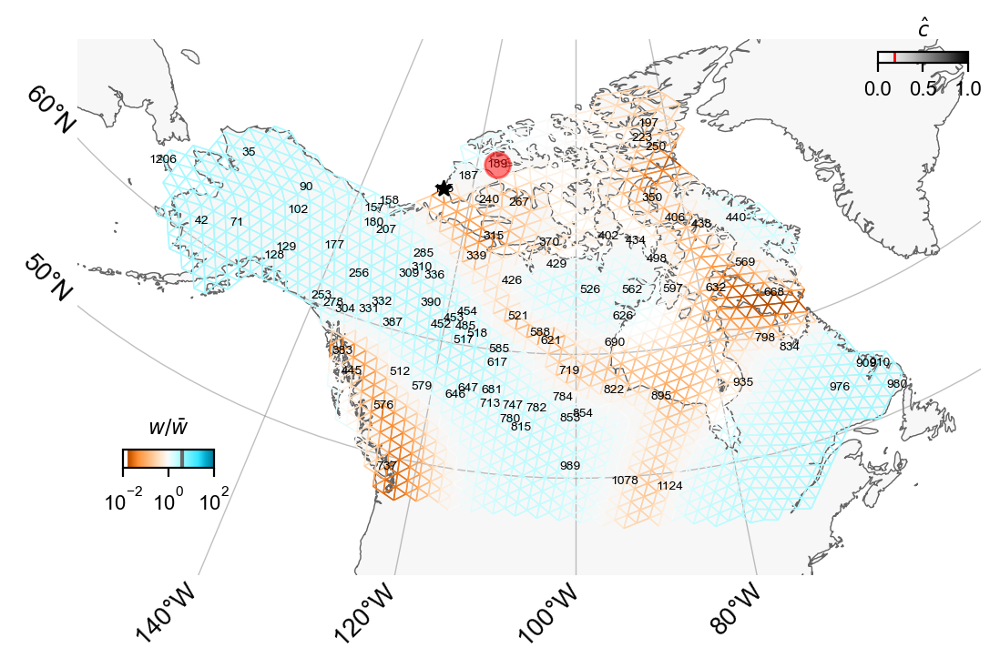

In [134]:
# contour_df189 = obj.calc_contour(destpid=189, search_area='all')

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_df189,levels=[-20,-10,-2,0])
v.ax.plot(obs_grid[np.where(permuted_idx == 187)[0], 0], obs_grid[np.where(permuted_idx == 187)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 189)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 189)[0], 1][0]))

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

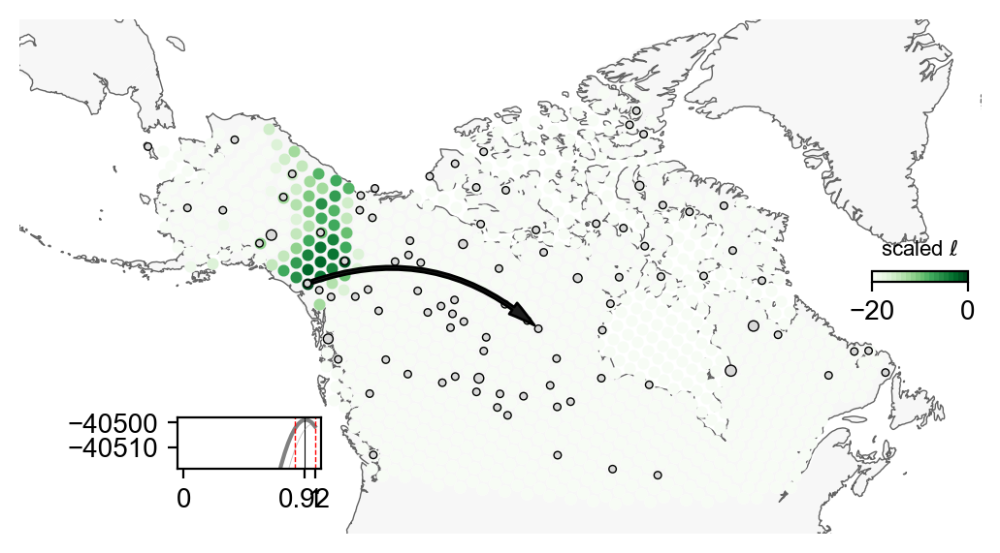

In [82]:
# contour_df621 = obj.calc_contour(destpid=621, search_area='range', opts=[[-115,-180],[40,80]])  
# contour_df621 = obj.calc_contour(destid=621, search_area='all')

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df621,levels=[0,0.1,0.25,0.5,1])
# v.ax.plot(obs_grid[np.where(permuted_idx == 621)[0], 0], obs_grid[np.where(permuted_idx == 621)[0], 1], 'ro', markersize=10, alpha=0.5)

# e = 621
fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection);  ax.set_extent([-160, -55, 37, 80])
v = Viz(ax, wolves_graph, obj, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,
        obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=False); 
v.draw_arrow([contour_df621['(source, dest.)'].iloc[np.argmax(contour_df621['scaled log-lik'])]],0.9)
v.draw_ll_contour(contour_df621,levels=[-20,-10,-2,0]); v.draw_obs_nodes(use_ids=False); 
# pe = contour_dict[e]['(source, dest.)'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])]
# v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],1.,lw=1.66,hw=0.8e5,hl=.8e5,mode='unsampled',fs=0)
# v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],contour_dict[e]['admix. prop.'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])],lw=.5,hw=.8e5,hl=.8e5,mode='unsampled',fs=2)

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

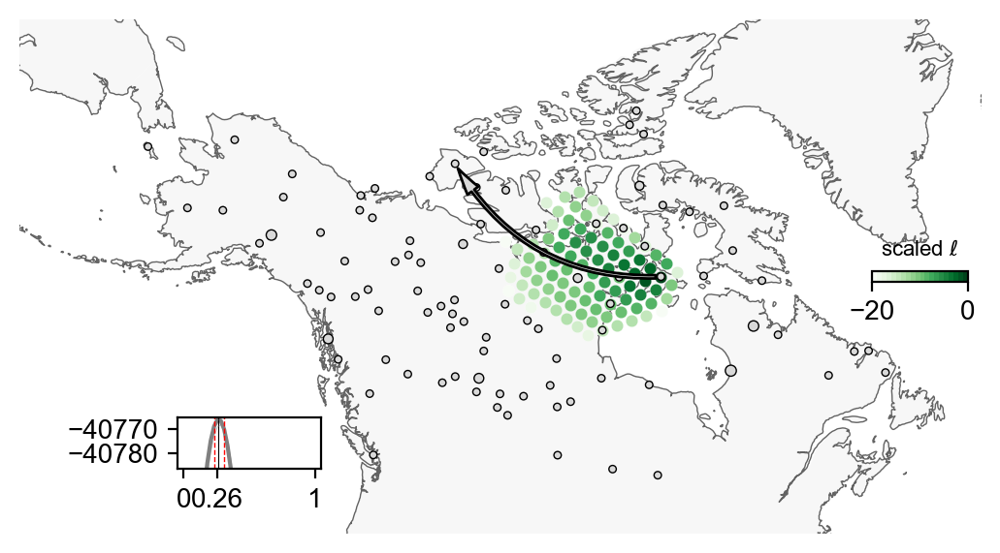

In [107]:
# contour_df187 = obj.calc_contour(destid=187, search_area='all') 

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df187,levels=2)
# v.ax.plot(obs_grid[np.where(permuted_idx == 187)[0], 0], obs_grid[np.where(permuted_idx == 187)[0], 1], 'ro', markersize=10, alpha=0.5)

# e = 187
fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection);  ax.set_extent([-160, -55, 37, 80])
v = Viz(ax, wolves_graph, obj, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,
        obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=False); 
v.draw_arrow([contour_df187['(source, dest.)'].iloc[np.argmax(contour_df187['scaled log-lik'])]],0.25)
v.draw_ll_contour(contour_df187,levels=[-20,-10,-2,0]); v.draw_obs_nodes(use_ids=False); 
# pe = contour_dict[e]['(source, dest.)'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])]
# v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],1.,lw=1.66,hw=0.8e5,hl=.8e5,mode='unsampled',fs=0)
# v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],contour_dict[e]['admix. prop.'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])],lw=.5,hw=.8e5,hl=.8e5,mode='unsampled',fs=2)

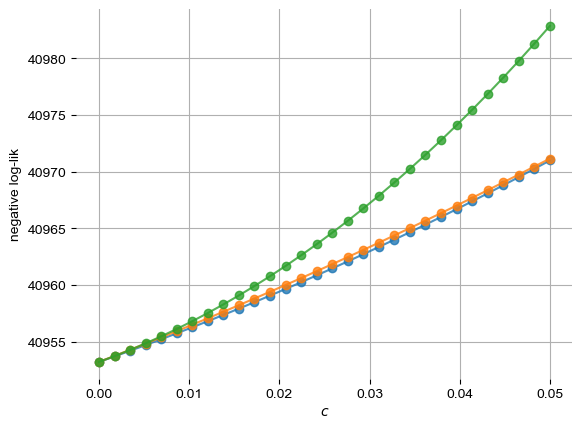

In [485]:
cmesh = np.linspace(0,0.05,30)
plt.plot(cmesh,[obj.neg_log_lik_c(c,opts={'lre':[(138,37)],'mode':'unsampled'}) for c in cmesh],'-o',alpha=0.8); plt.xlabel(r'$c$'); plt.ylabel('negative log-lik'); plt.grid(); plt.box(False)
plt.plot(cmesh,[obj.neg_log_lik_c(c,opts={'lre':[(499,37)],'mode':'unsampled'}) for c in cmesh],'-o',alpha=0.8); plt.plot(cmesh,[obj.neg_log_lik_c(c,opts={'lre':[(188,37)],'mode':'unsampled'}) for c in cmesh],'-o',alpha=0.8); 

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

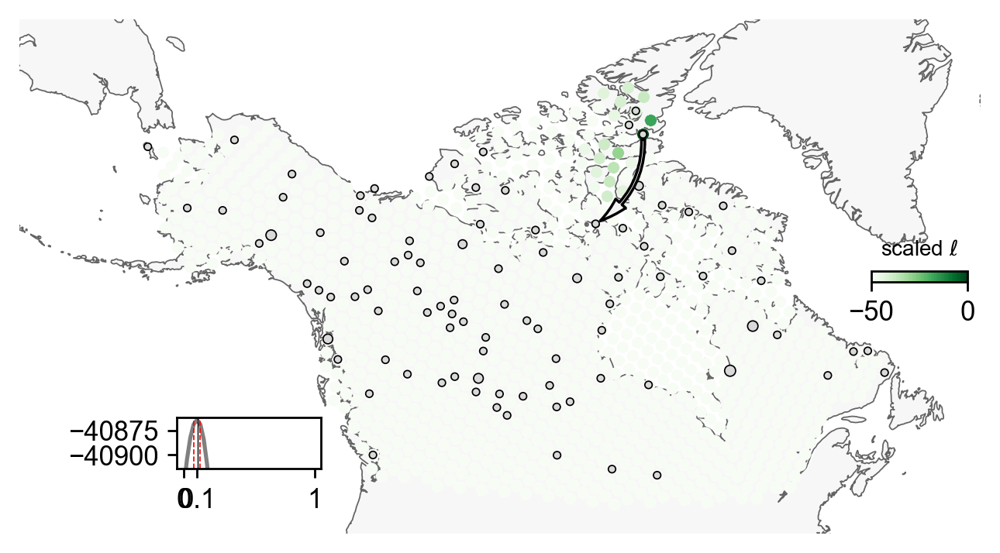

In [71]:
# contour_df402 = obj.calc_contour(destid=402, search_area='all') # 4m21s for Nelder-Mead
# contour402 = obj.calc_contour(destpid=402, search_area='all') # 2m8s for L-BFGS-B
# contour402.iloc[np.where(contour402['admix. prop.']>0.1)]
# plt.scatter(contour_df402['admix. prop.'],contour402['admix. prop.']); plt.axline((0.1,0.1),slope=1,color='grey'); plt.grid(); plt.box(False)
# plt.xlabel('Nelder-Mead estimates'); plt.ylabel('L-BFGS-B estimates')
# contour402['(source, dest.)'].iloc[np.where(contour402['admix. prop.'].iloc[np.where(contour_df402['admix. prop.']==0)[0]]>0.03)]
# contour402.loc[np.where(contour402['admix. prop.'].iloc[np.where(contour_df402['admix. prop.']==0)[0]]>0.03)]

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df402,levels=2)
# v.ax.plot(obs_grid[np.where(permuted_idx == 402)[0], 0], obs_grid[np.where(permuted_idx == 402)[0], 1], 'ro', markersize=10, alpha=0.5)

# e = 402
fig = plt.figure(dpi=250)
ax = fig.add_subplot(1, 1, 1, projection=projection); ax.set_extent([-160, -55, 37, 80])
v = Viz(ax, wolves_graph, obj, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=False); #v.draw_edges(use_weights=True); v.draw_edge_colorbar()
v.draw_arrow([(250,402)],0.1)
v.draw_ll_contour(contour_df402,levels=[-50,-10,-2,0]); v.draw_obs_nodes(use_ids=False); 
# pe = contour_dict[e]['(source, dest.)'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])]
# v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],1.,lw=1.66,hw=0.8e5,hl=.8e5,mode='unsampled',fs=0)
# v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],pe[1])],contour_dict[e]['admix. prop.'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])],lw=.5,hw=.8e5,hl=.8e5,mode='unsampled',fs=2)

In [484]:
sp.optimize.minimize(obj.neg_log_lik_c, x0=0.6, bounds=[(0,1)], tol=0.001, method='L-BFGS-B', args={'lre':[(586,90)],'mode':'unsampled'})

[0.6]
[0.60000001]
[0.]
[1.e-08]
[0.10388389]
[0.1038839]


      fun: 40949.056101914495
 hess_inv: <1x1 LbfgsInvHessProduct with dtype=float64>
      jac: array([-0.74505806])
  message: 'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 6
      nit: 2
     njev: 3
   status: 0
  success: True
        x: array([0.10388389])

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

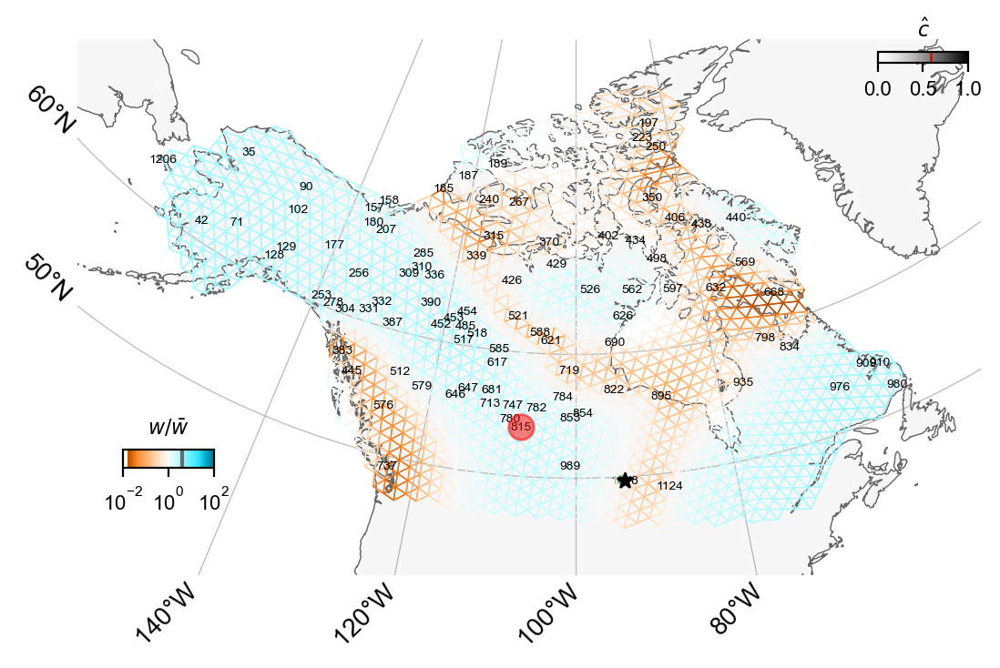

NameError: name 'projection' is not defined

<Figure size 1280x960 with 0 Axes>

In [ ]:
# contour_df815 = obj.calc_contour(destpid=815, search_area='all')
# contour_df815 = contour_df815.drop(np.where(np.isnan(contour_df815['scaled log-lik']))[0]+1)

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df815,levels=3,ll_thresh=-40)
# v.ax.plot(obs_grid[np.where(permuted_idx == 815)[0], 0], obs_grid[np.where(permuted_idx == 815)[0], 1], 'ro', markersize=10, alpha=0.5)

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_df815,levels=[-20,-10,-2,0])
v.ax.plot(obs_grid[np.where(permuted_idx == 815)[0], 0], obs_grid[np.where(permuted_idx == 815)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 815)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 815)[0], 1][0]))

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

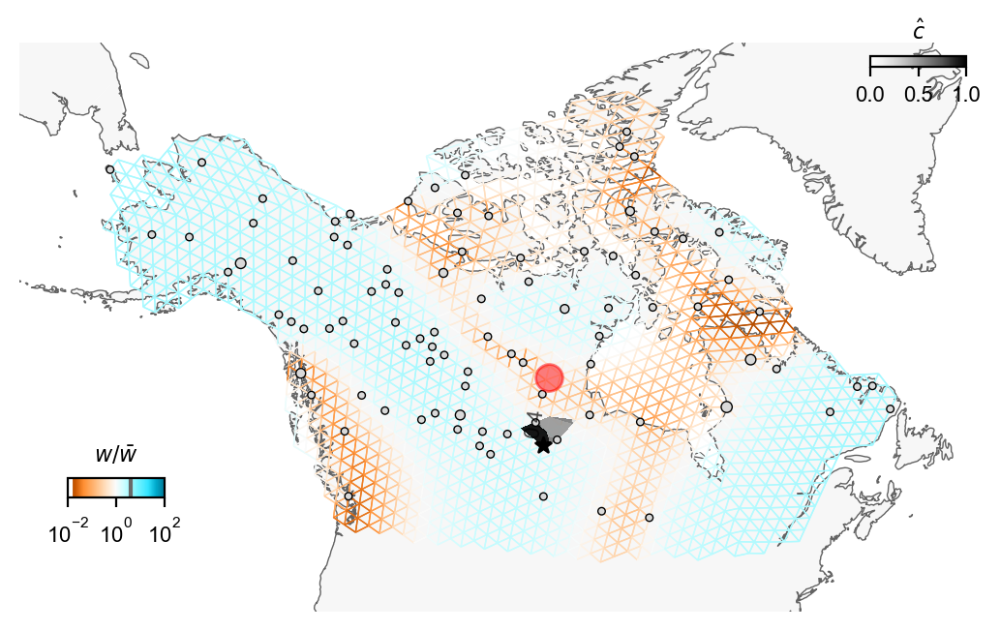

In [123]:
# contour_df747 = obj.calc_contour(destpid=747, search_area='all')
# contour_df747 = contour_df747.drop([620,650,683]) # np.where(np.isnan(contour_df747['scaled log-lik']))[0]+1

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
v.draw_c_contour(contour_df747,levels=1,ll_thresh=-60)
v.ax.plot(obs_grid[np.where(permuted_idx == 747)[0], 0], obs_grid[np.where(permuted_idx == 747)[0], 1], 'ro', markersize=10, alpha=0.5)

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
# v.draw_ll_contour(contour_df747,levels=[-20,-10,-2,0])
# v.ax.plot(obs_grid[np.where(permuted_idx == 390)[0], 0], obs_grid[np.where(permuted_idx == 390)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 747)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 747)[0], 1][0]))

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

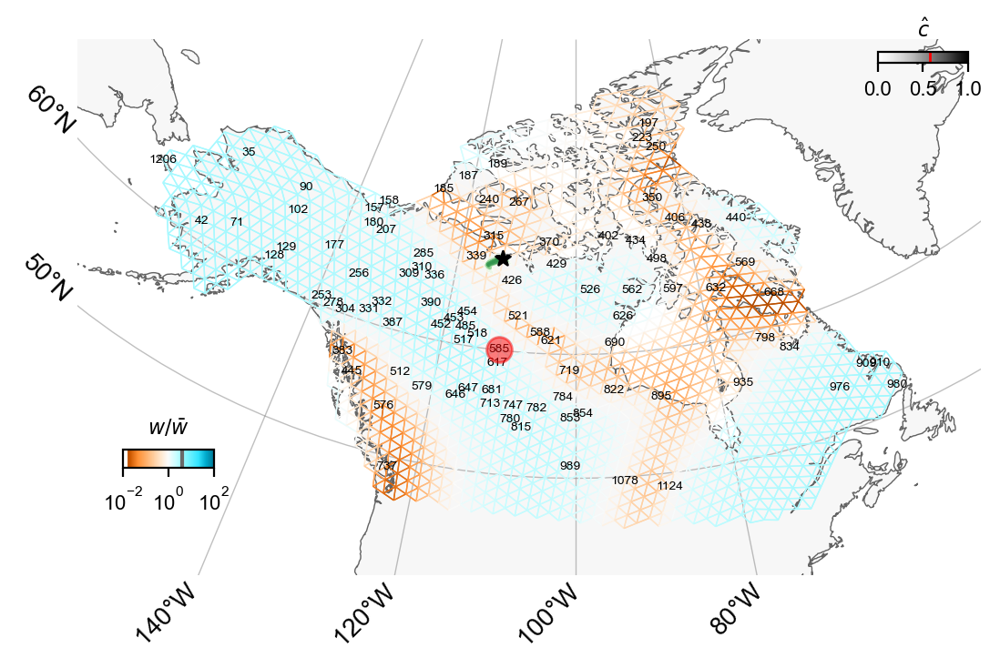

In [96]:
# contour_df585 = obj.calc_contour(destpid=585, search_area='all')

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_df585,levels=[-20,-10,-5,0])
v.ax.plot(obs_grid[np.where(permuted_idx == 390)[0], 0], obs_grid[np.where(permuted_idx == 390)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 585)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 585)[0], 1][0]))

In [498]:
np.where(permuted_idx==390)

(array([81]),)

NameError: name 'contour_df834' is not defined

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packa

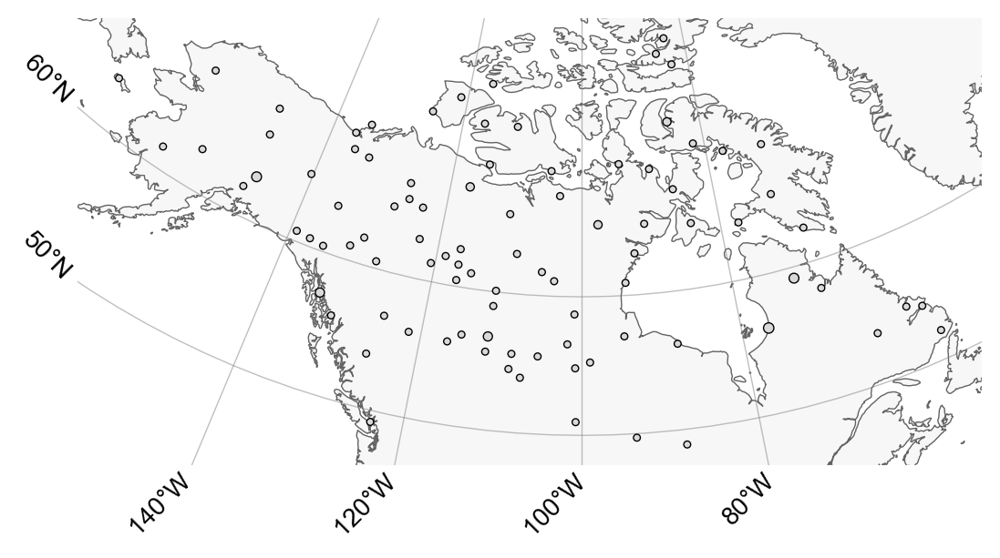

In [211]:
# contour_df834 = obj.calc_contour(destpid=834, search_area='all')
# contour_df834 = contour_df834.drop(np.where(np.isnan(contour_df834['scaled log-lik']))[0]+1)

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_obs_nodes(use_ids=False); 
v.draw_ll_contour(contour_df834,levels=[-10,-5,0])
v.draw_arrow([(453,834)],c=1)

In [ ]:
# contour_df834 = obj.calc_contour(destpid=390, search_area='all')
# contour_df390 = contour_df390.drop(295)

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df390,levels=3,ll_thresh=-10)
# v.ax.plot(obs_grid[np.where(permuted_idx == 390)[0], 0], obs_grid[np.where(permuted_idx == 390)[0], 1], 'ro', markersize=10, alpha=0.5)


fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_df390,levels=[-20,-10,-5,0])
v.ax.plot(obs_grid[np.where(permuted_idx == 390)[0], 0], obs_grid[np.where(permuted_idx == 390)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 390)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 390)[0], 1][0]))

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

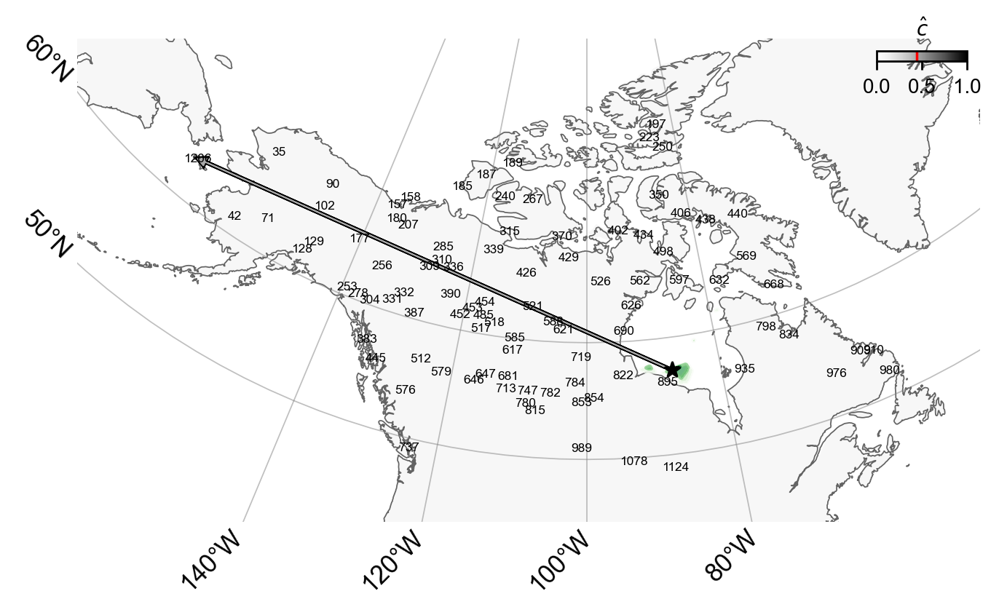

In [799]:
# contour_df1206 = obj.calc_contour(destpid=1206, search_area='range', opts=[[-60,-115],[50,70]])
# contour_df1206 = contour_df1206.drop(np.where(np.isnan(contour_df1206['scaled log-lik']))[0]+1)
# contour_dict[1206] = contour_df1206

e = 1206
fig = plt.figure(dpi=250)
ax = fig.add_subplot(1, 1, 1, projection=projection); ax.set_extent([-160, -55, 37, 80])
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_obs_nodes(use_ids=True); #v.draw_edges(use_weights=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_dict[1206],levels=[-20,-10,-2,0])
pe = contour_dict[e]['(source, dest.)'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])]
v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],93)],1.,lw=1.66,hw=0.8e5,hl=.8e5,mode='unsampled',fs=0)
v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],93)],contour_dict[e]['admix. prop.'].iloc[np.argmax(contour_dict[e]['scaled log-lik'])],lw=.5,hw=.8e5,hl=.8e5,mode='unsampled',fs=2)

In [48]:
# import networkx as nx
# sample_idx = nx.get_node_attributes(wolves_graph, "sample_idx")
# permuted_idx = query_node_attributes(wolves_graph, "permuted_idx")
# observed_permuted_idx = permuted_idx[: wolves_graph.n_observed_nodes]

# freqs = np.zeros_like(wolves_graph.frequencies)
# for i, node_id in enumerate(observed_permuted_idx):
#     s = sample_idx[node_id]

#     # compute mean at each node
#     freqs[i,:] = np.mean(wolves_graph.genotypes[s,:], axis=0)/2

# het = 2*freqs*(1-freqs)

# plt.plot(np.arange(1,wolves_graph.n_observed_nodes+1),het.mean(axis=1),'ko'); plt.axhline(het.mean(),color='red',linestyle='--'); plt.xlabel('deme ID'); plt.ylabel('average heterozygosity'); plt.grid()

## Rerunning FEEMSmix with a None fit 

In [1002]:
# wolves_graph.fit(lamb=2., optimize_q='n-dim', lamb_q=0)

# obj = FEEMSmix_Objective(wolves_graph); obj.inv(); obj.Lpinv = np.linalg.pinv(wolves_graph.L.todense()); obj.grad(reg=False)

# outliers_dfnone = obj.extract_outliers(pthresh=0.001, verbose=False)

1207

NameError: name 'draw_admix_pie' is not defined

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

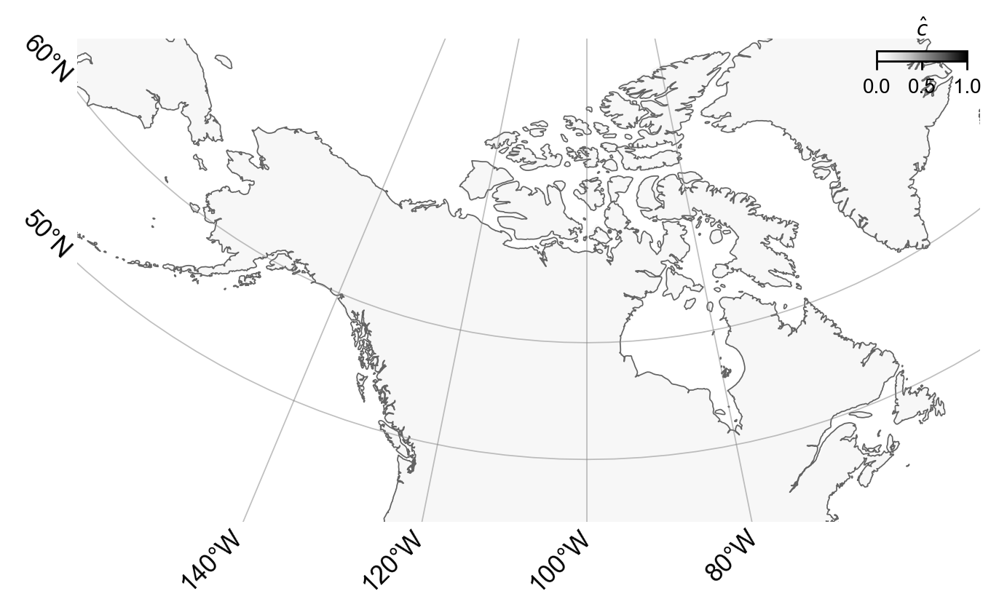

In [210]:
# contour_dict_none[e]['admix. prop.'].iloc[np.argmax(contour_dict_none[e]['scaled log-lik'])]
fig = plt.figure(dpi=250)
ax = fig.add_subplot(1, 1, 1, projection=projection); ax.set_extent([-160, -55, 37, 80])
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_c_colorbar(); #v.draw_obs_nodes(use_ids=True); v.draw_edges(use_weights=True); v.draw_edge_colorbar()
for i in permuted_idx[:wolves_graph.n_observed_nodes]:
        draw_admix_pie(Q_k7[wolves_graph.nodes[i]['sample_idx'][0], :], v.grid[i, 0], v.grid[i, 1], colors_k7, radius=radius*0.9, ax=ax)
for e in np.unique(outliers_dfnone['dest.']):
    pe = contour_dict_none[e]['(source, dest.)'].iloc[np.argmax(contour_dict_none[e]['scaled log-lik'])]
    v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],np.where(permuted_idx==pe[1])[0][0])],1.,lw=1.66,hw=0.8e5,hl=.8e5,mode='unsampled',fs=0)
    v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],np.where(permuted_idx==pe[1])[0][0])],contour_dict_none[e]['admix. prop.'].iloc[np.argmax(contour_dict_none[e]['scaled log-lik'])],lw=.5,hw=.8e5,hl=.8e5,mode='unsampled',fs=0)

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

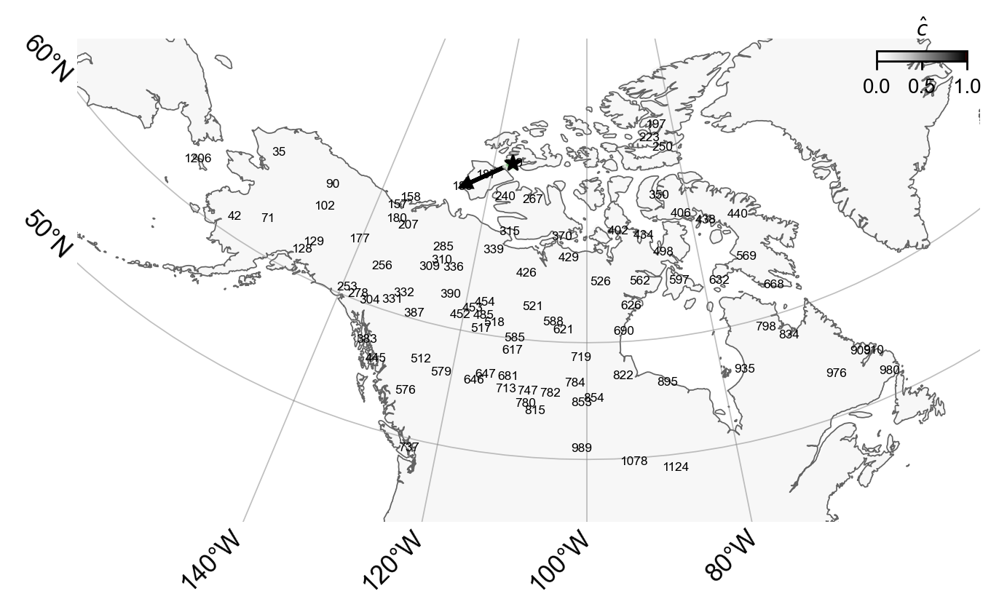

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

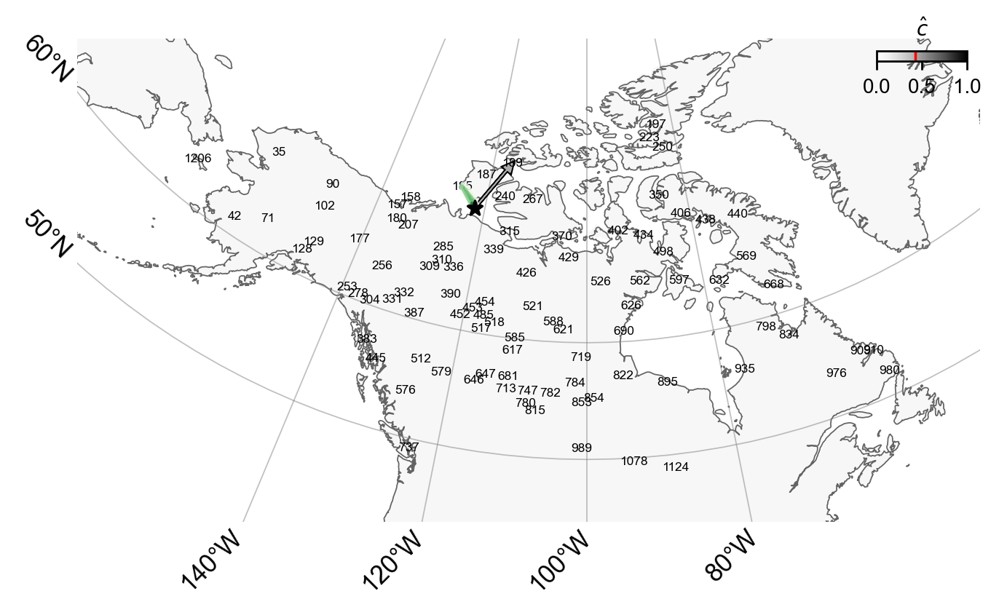

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

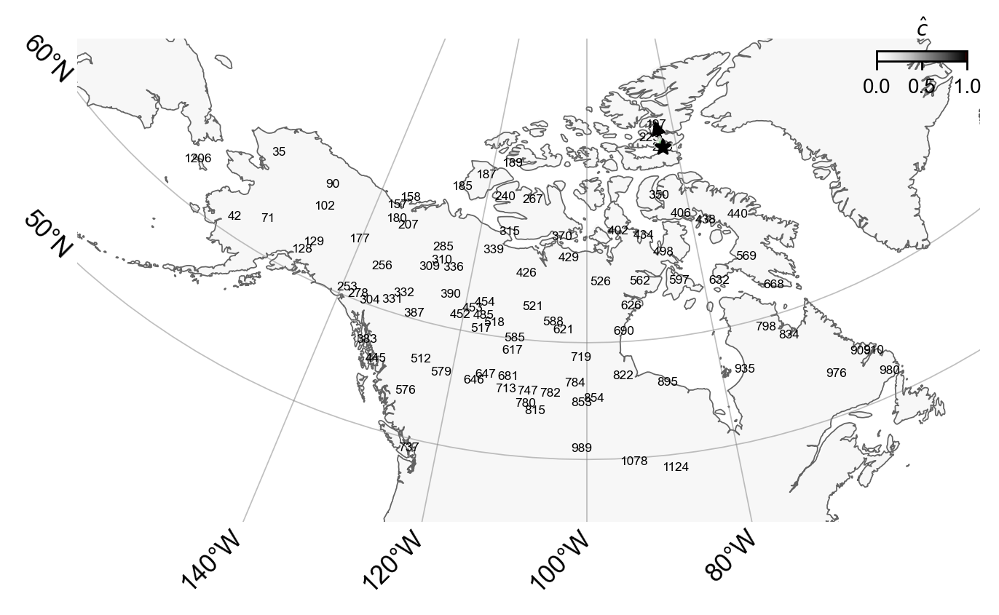

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

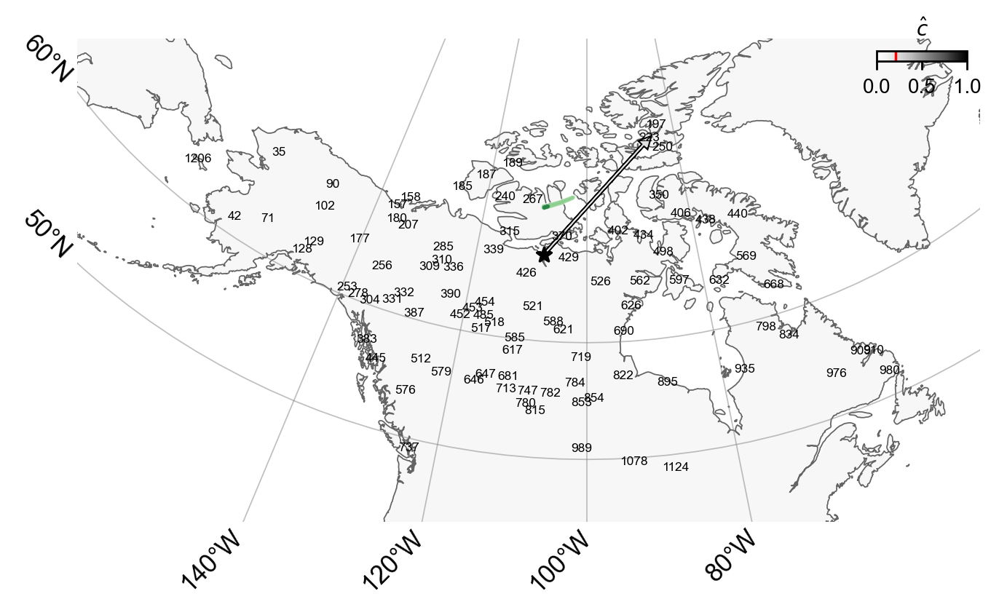

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

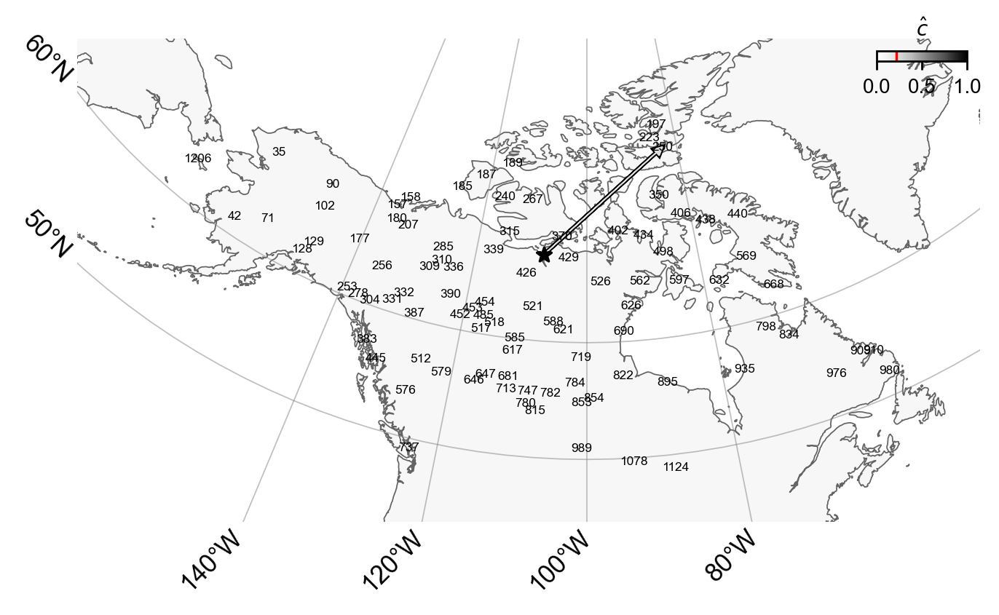

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

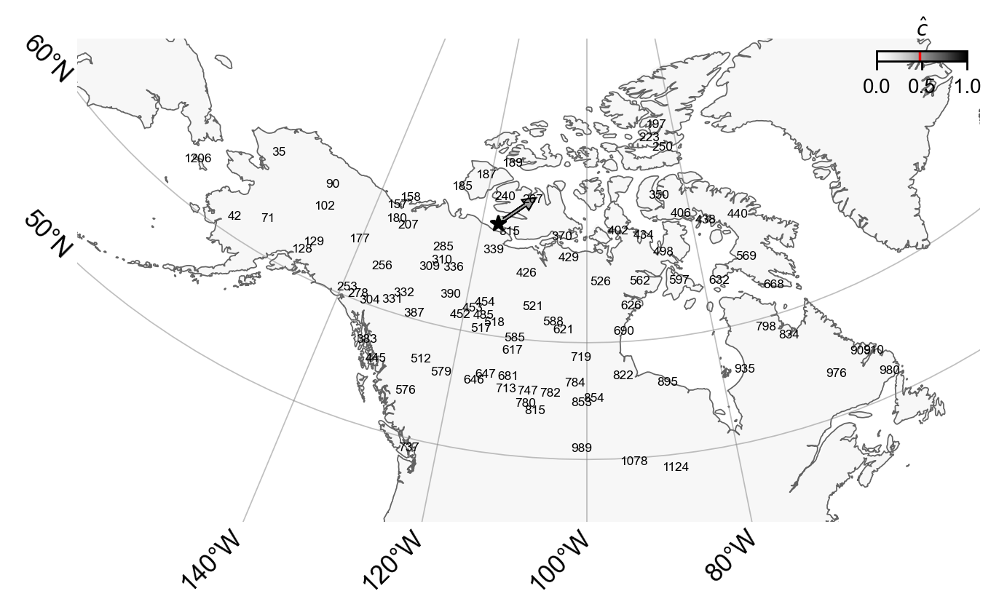

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

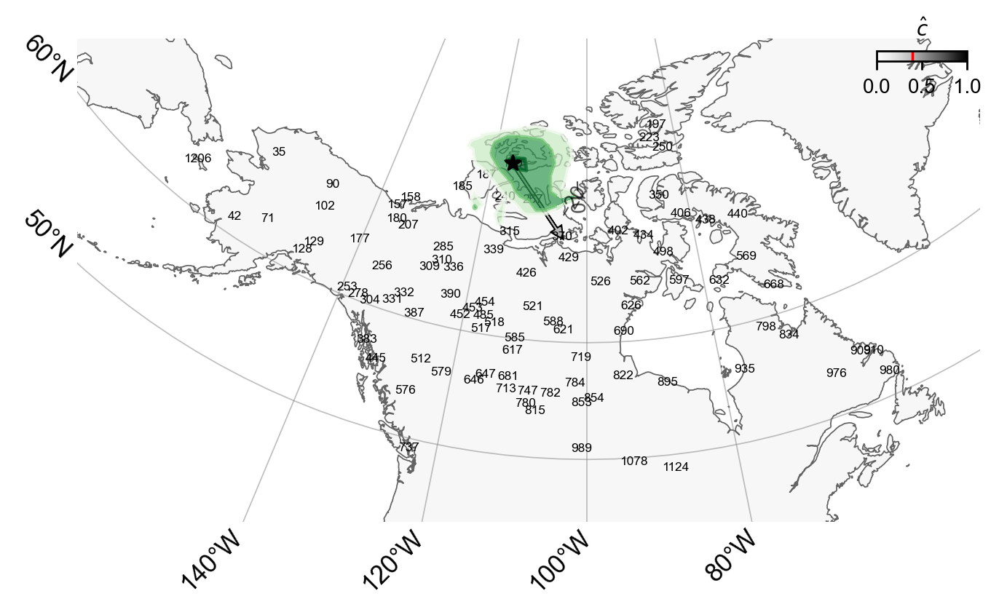

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

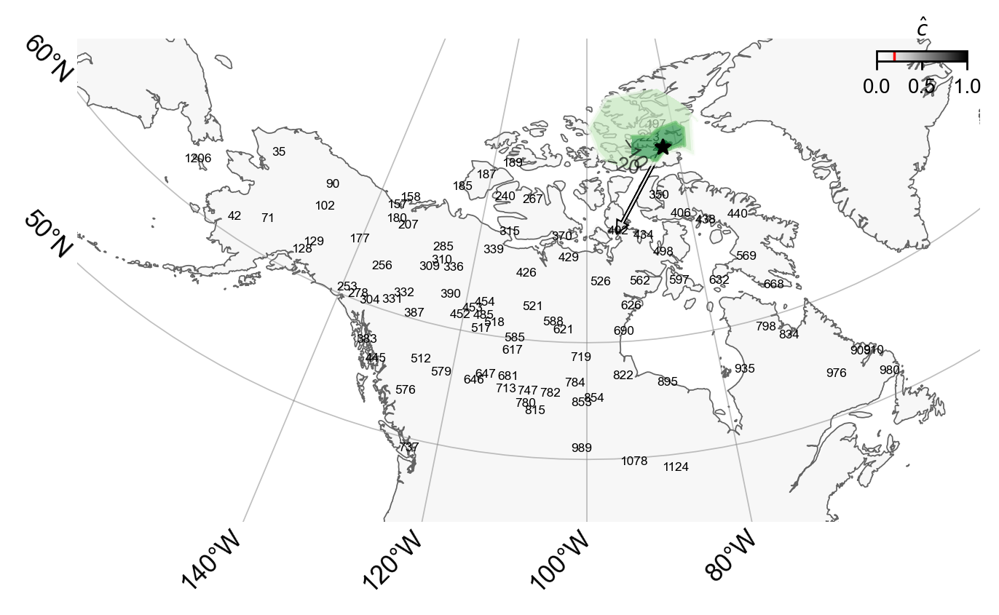

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

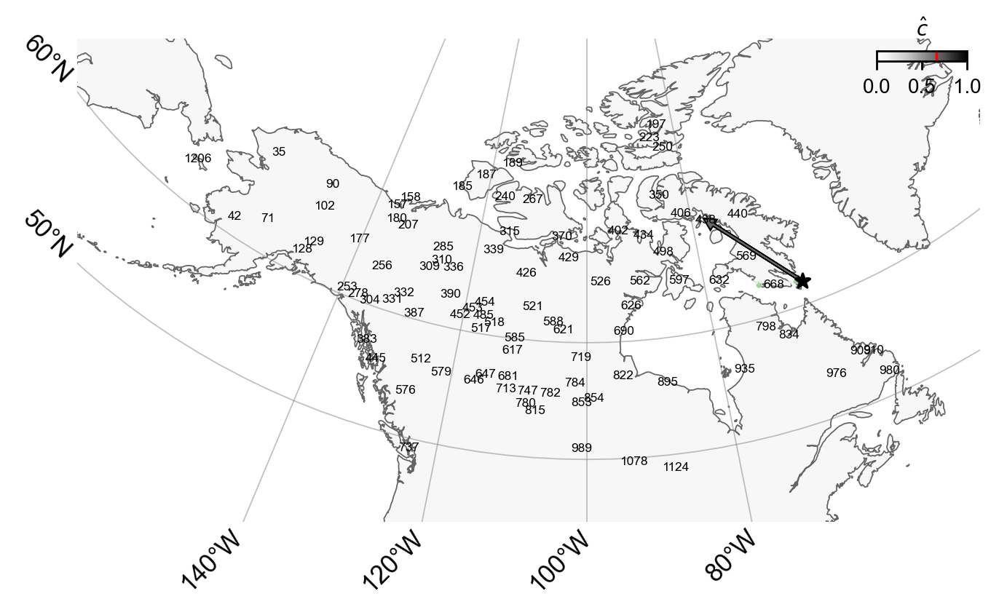

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

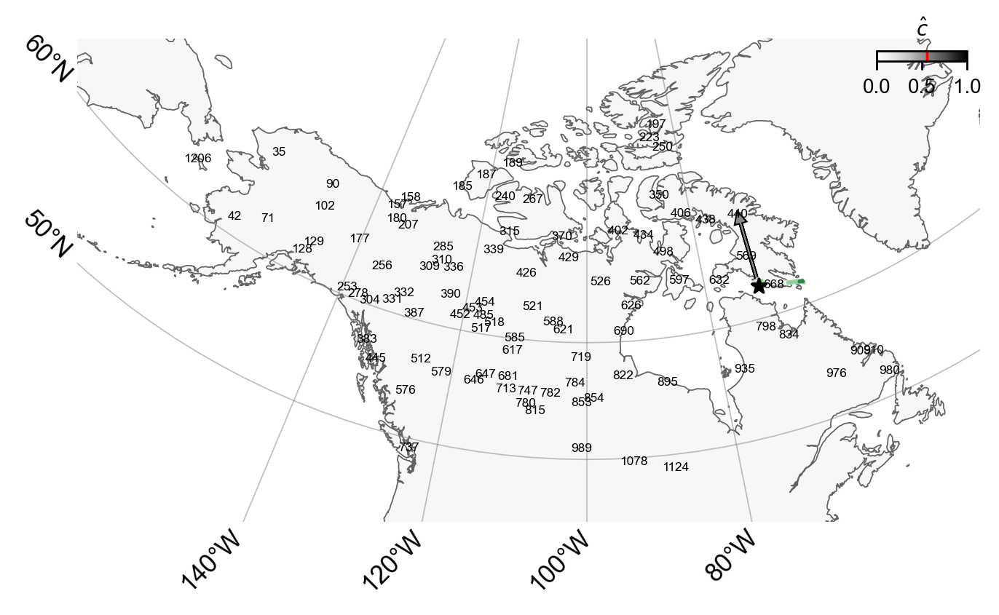

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

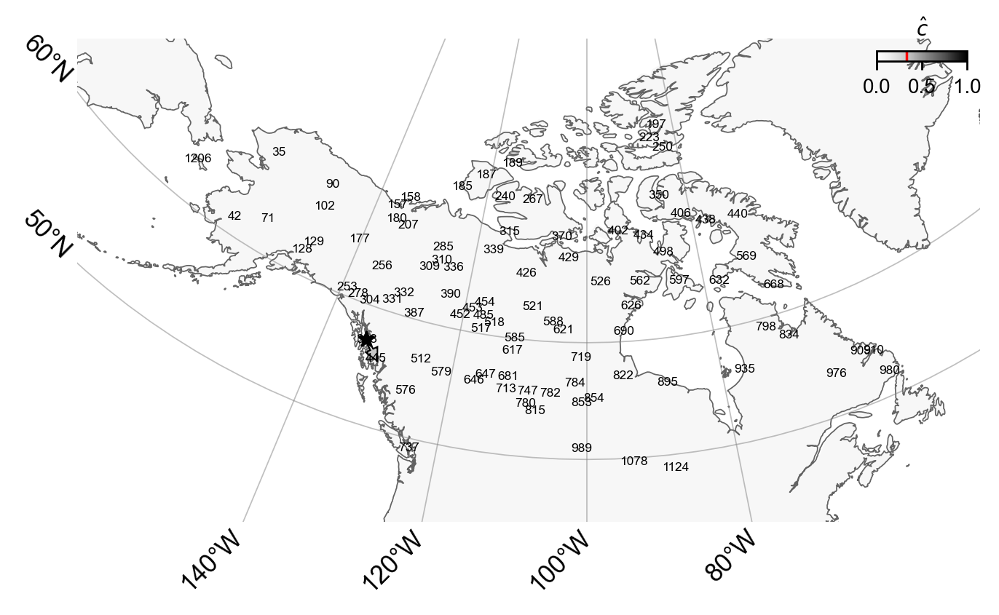

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

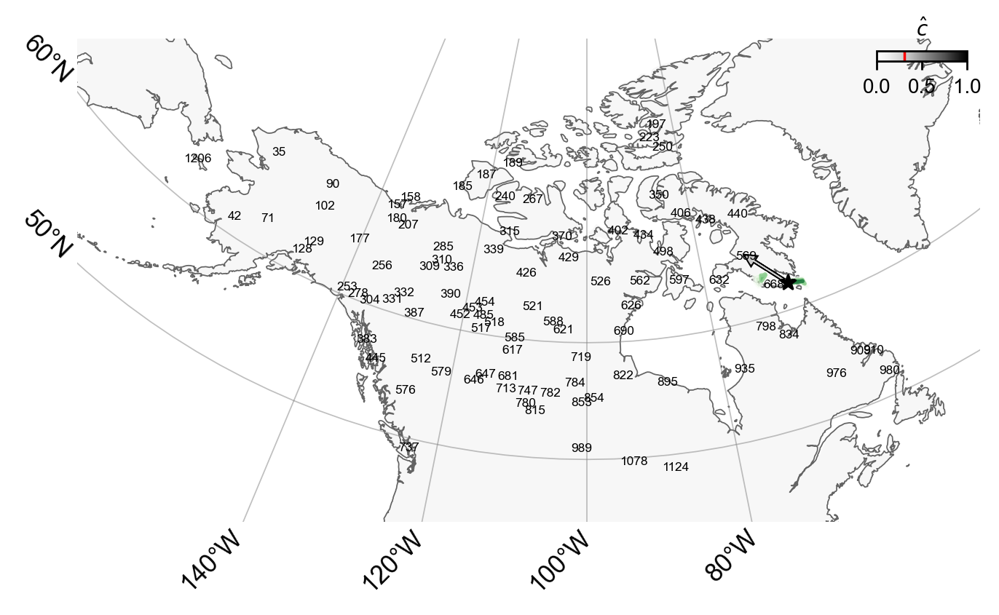

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

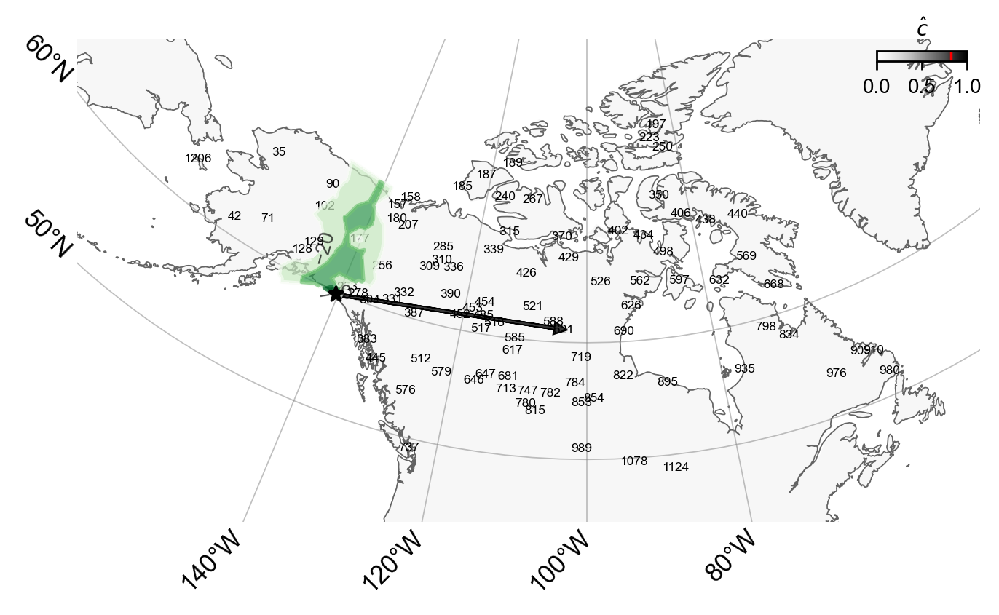

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

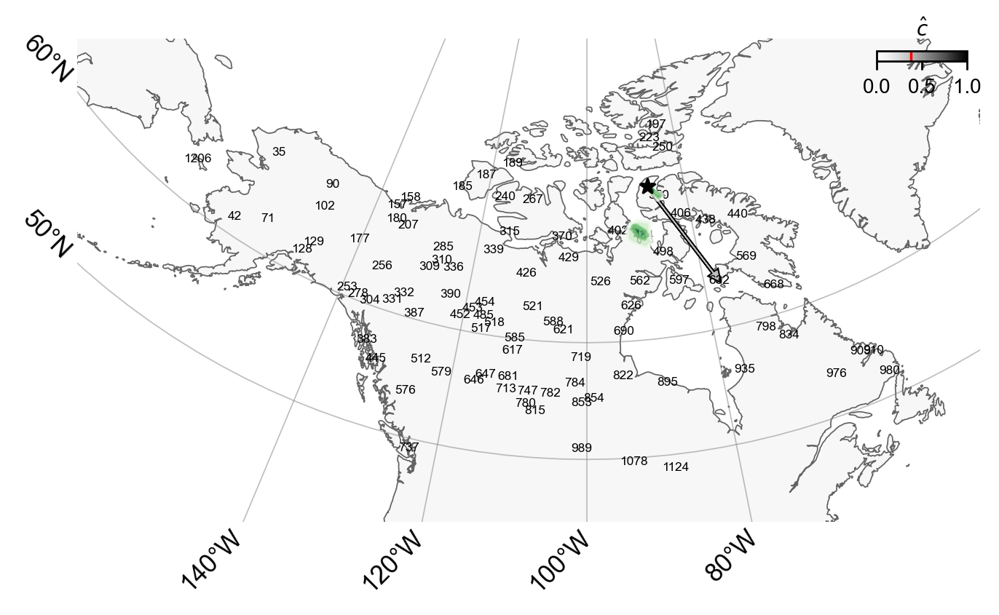

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

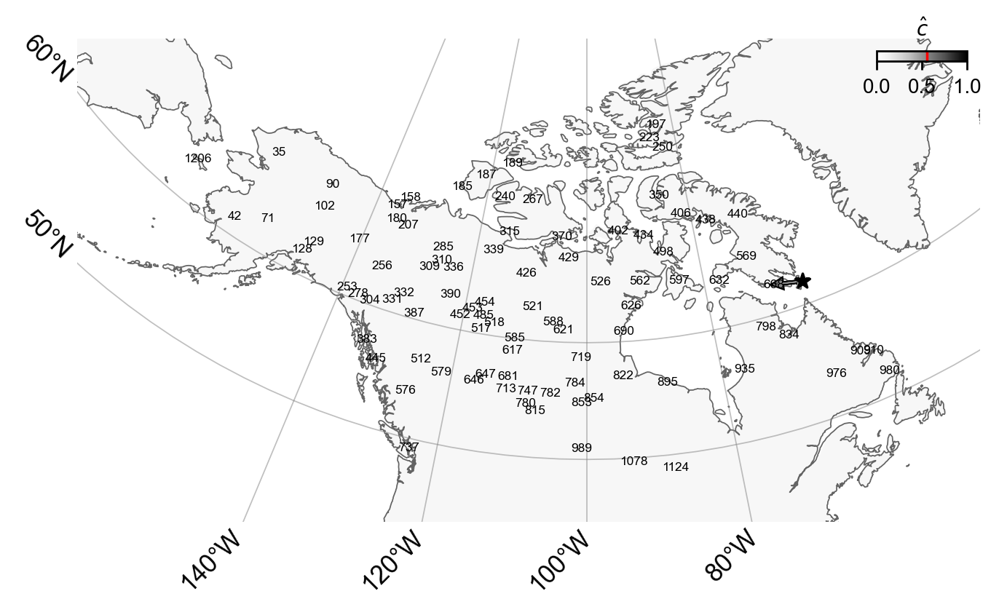

In [836]:
# contour_dict_none = {}
# for e in np.unique(outliers_dfnone['dest.']):
#     print('searching edges for dest. node {}'.format(e))
#     contour_dict_none[e] = obj.calc_contour(destpid=int(e), search_area='all')

for e in np.unique(outliers_dfnone['dest.']):
    contour_dict_none[e] = contour_dict_none[e].drop(np.where(np.isnan(contour_dict_none[e]['scaled log-lik']))[0]+1)
    fig = plt.figure(dpi=250)
    ax = fig.add_subplot(1, 1, 1, projection=projection); ax.set_extent([-160, -55, 37, 80])
    v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
    v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_obs_nodes(use_ids=True); #v.draw_edges(use_weights=True); v.draw_edge_colorbar()
    v.draw_ll_contour(contour_dict_none[e],levels=[-20,-10,-2,0]); 
    pe = contour_dict_none[e]['(source, dest.)'].iloc[np.argmax(contour_dict_none[e]['scaled log-lik'])]
    v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],np.where(permuted_idx==pe[1])[0][0])],1.,lw=1.66,hw=0.8e5,hl=.8e5,mode='unsampled',fs=0)
    v.draw_arrow([(np.where(permuted_idx==pe[0])[0][0],np.where(permuted_idx==pe[1])[0][0])],contour_dict_none[e]['admix. prop.'].iloc[np.argmax(contour_dict_none[e]['scaled log-lik'])],lw=.5,hw=.8e5,hl=.8e5,mode='unsampled',fs=0)

/var/folders/vc/r8504j4j0ds4cvn52fqczvzh0000gr/T/ipykernel_63362/765398906.py:15: RuntimeWarning: divide by zero encountered in log10
  ax_00.scatter(np.log10(x),


Text(0, 0.5, 'genetic distance')

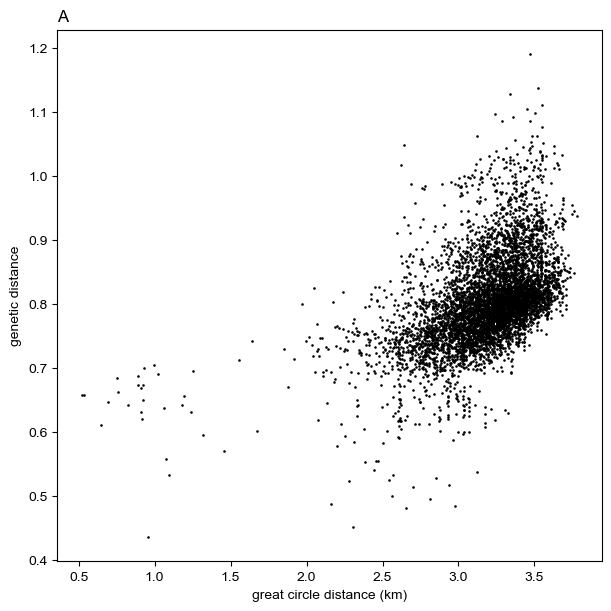

In [35]:
fig = plt.figure(constrained_layout=True, dpi=100, figsize=(6, 6))
D_geno = squareform(pdist(genotypes, metric="sqeuclidean")) / p
coord_rad = coord[:,::-1] * np.pi / 180.0
D_geo = haversine_distances(coord_rad) * 6371000/1000
tril_idx = np.tril_indices(n, k=-1)
x = D_geo[tril_idx]
y = D_geno[tril_idx]
X = sm.add_constant(x)
mod = sm.OLS(y, X)
res = mod.fit()
muhat, betahat = res.params

ax_00 = fig.add_subplot(1,1,1)
ax_00.set_title("A", loc='left')
ax_00.scatter(x, 
              y, 
              marker=".", 
              alpha=1, 
              zorder=0, 
              color="black",
              s=3)

x_ = np.linspace(np.min(x), np.max(x), 20)
ax_00.plot(x_, muhat + betahat * x_, zorder=2, color="orange", linestyle='--', linewidth=1)
ax_00.text(3500, .6, "R²={:.4f}".format(res.rsquared))
ax_00.set_xlabel("great circle distance (km)")
ax_00.set_ylabel("genetic distance")

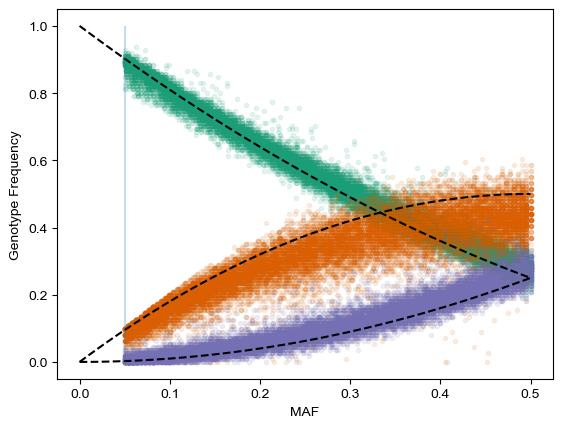

In [21]:
Y = 2 - genotypes
n, p = Y.shape

f = np.nansum(Y, axis=0) / (2.0*n)
f_aa = np.nansum(Y==0, axis=0) / n
f_Aa = np.nansum(Y==1, axis=0) / n
f_AA = np.nansum(Y==2, axis=0) / n

x = np.linspace(0, .5)
plt.scatter(f, f_aa, alpha=.1, marker=".", color="#1b9e77", zorder=0)
plt.plot(x, (1-x)**2, "--", color="black", zorder=1) 
plt.scatter(f, f_Aa, alpha=.1, marker=".", color="#d95f02", zorder=0)
plt.plot(x, 2*x*(1-x), "--", color="black", zorder=1) 
plt.scatter(f, f_AA, alpha=.1, marker=".", color="#7570b3", zorder=0)
plt.plot(x, x**2, "--", color="black", zorder=1) 
plt.xlabel("MAF");
plt.ylabel("Genotype Frequency");
plt.vlines(ymin=0, ymax=1, x=.05, linestyles="-", alpha=.25)

In [13]:
# permuted_idx = query_node_attributes(wolves_graph, "permuted_idx")
# obs_perm_ids = permuted_idx[: wolves_graph.n_observed_nodes]

# # code for mapping nodes back to populations (since multiple pops can be assigned to the same nodes)
# node_to_pop = pd.DataFrame(index = np.arange(wolves_graph.n_observed_nodes), columns = ['nodes', 'pops'])
# node_to_pop['nodes'] = obs_perm_ids
# 
# max_res_nodes = [(73, 34),(93, 69),(62, 54),(15, 31),(92,78)]
# list(map(tuple,node_to_pop['nodes'][np.ravel(max_res_nodes)].values.reshape(5,2)))
# node_pos == grid, sample_pos == coord
# wolves_graph.fit(lamb=2.,optimize_q='n-dim',lamb_q=1.,alpha_q=1.)
# wolves_graph.fit(lamb=3.,optimize_q='n-dim',lamb_q=1.,alpha_q=0.1,option='onlyc',long_range_edges=[(73, 34),(93, 69),(62, 54),(15, 31),(92,78)])

/Users/vivaswatshastry/src/feems/docs/notebooks/../../feems/viz.py:146: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  self.idx = nx.adjacency_matrix(self.sp_graph).nonzero()
/Users/vivaswatshastry/src/feems/docs/notebooks/../../feems/viz.py:333: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  idx = list(np.column_stack(idx))
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/viv

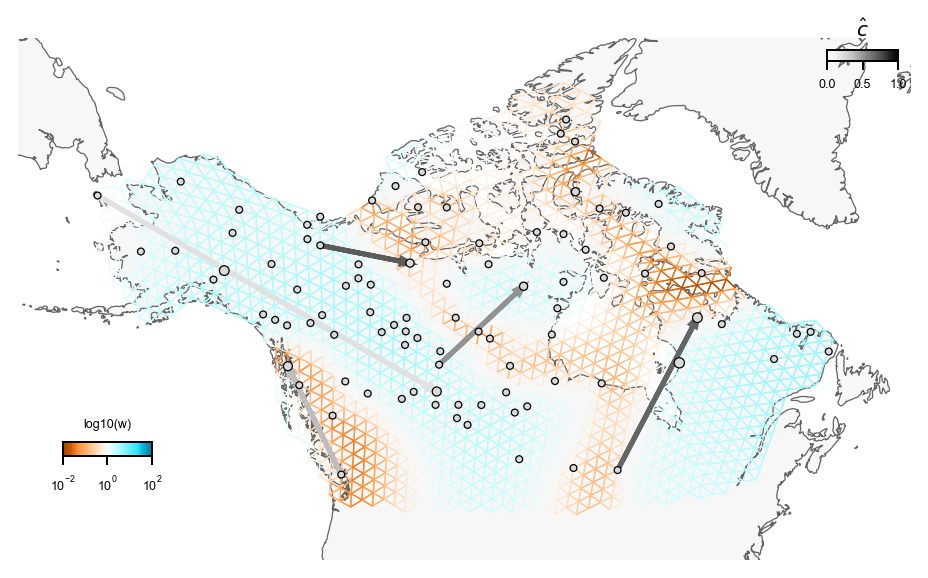

In [223]:
fig = plt.figure(dpi=180)
# wolves_graph.fit(lamb=2.,optimize_q='n-dim',lamb_q=1.,alpha_q=1.)
# wolves_graph.fit(lamb=2.,optimize_q='n-dim',lamb_q=1.,alpha_q=.1,option='onlyc',long_range_edges=[(73, 34),(93, 69),(62, 54),(15, 31),(92,78)])
projection = ccrs.EquidistantConic(central_longitude=-108.842926, central_latitude=66.037547) 
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=20, 
        obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=5,
        cbar_font_size=5, cbar_width='10%',cbar_height='2.5%')
v.draw_map(); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
for ie, e in enumerate([(737, 383), (1206, 681), (617, 526), (207, 339), (1124, 798)]):
        v.draw_arrow([e],wolves_graph.c[ie],lw=2,hw=50000,hl=80000)
v.draw_c_colorbar()

Now we can visualize the weighted graph:

constant-w/variance fit, converged in 132 iterations, train_loss=2795677.652
lambda=3.000, alpha=0.8354, converged in 64 iterations, train_loss=2751561.831


/Users/vivaswatshastry/src/feems/docs/notebooks/../../feems/viz.py:146: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  self.idx = nx.adjacency_matrix(self.sp_graph).nonzero()
/Users/vivaswatshastry/src/feems/docs/notebooks/../../feems/viz.py:331: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  idx = nx.adjacency_matrix(sp_graph).nonzero()
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffe

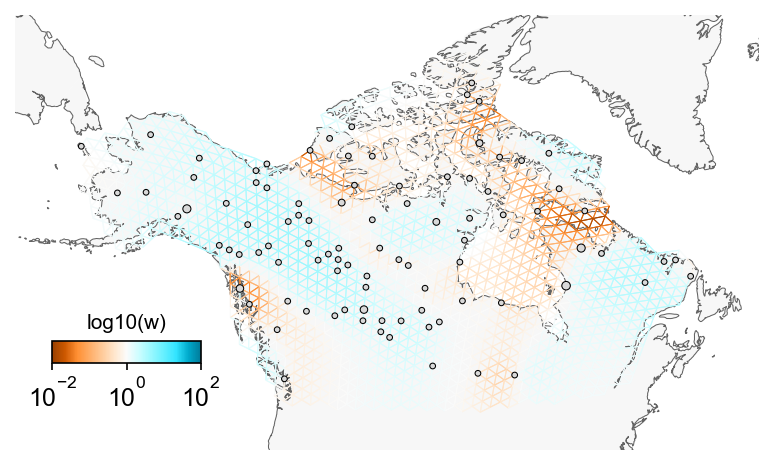

In [15]:
wolves_graph.fit(lamb=3., optimize_q='n-dim')
fig = plt.figure(dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=20, 
        obs_node_size=7.5, sample_pt_color="black", 
        cbar_font_size=10)
v.draw_map()
v.draw_edges(use_weights=True)
v.draw_obs_nodes(use_ids=False) 
v.draw_edge_colorbar()

## Implementing a bootstrapping procedure to compute standard errors on fitted vs genetic distances

I will be sampling inds with replacement from each population (keeping the pop size constant). The source of variation is the sampling of inds from a fixed true pop size in each deme. 

In [117]:
wolves_graph.n_samples_per_obs_node_permuted[86:]

array([1, 5, 1, 1, 1, 1, 1, 1])

In [132]:
# nreps = 10
# rng = np.random.default_rng(2022); ss = rng.bit_generator._seed_seq; child_states = ss.spawn(nreps)
# fit_dist = np.zeros((wolves_graph.n_observed_nodes*(wolves_graph.n_observed_nodes-1)//2,nreps+1)); emp_dist = np.zeros_like(fit_dist)
## first column contains the results from the whole data set (not bootstrap replicates)
# obj = Joint_Objective(wolves_graph)
# fit_cov, _, emp_cov = comp_mats(obj)
# fit_dist[:,0] = cov_to_dist(fit_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]
# emp_dist[:,0] = cov_to_dist(emp_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]

# def bootfun(seed,nsamps):
#     rng = np.random.default_rng(seed)
#     bootgenotypes = deepcopy(genotypes)
#     ctr = 0
#     for deme in range(len(nsamps)):
#         bootgenotypes[ctr:(ctr+nsamps[deme]),:] = genotypes[rng.choice(range(ctr,(ctr+nsamps[deme])),nsamps[deme]),:]
#         ctr += nsamps[deme]
#     temp_graph = Joint_SpatialGraph(bootgenotypes, coord, grid, edges)
#     temp_graph.fit(lamb=1., optimize_q='n-dim', lamb_q=1., alpha_q=1.0)
#     obj = Joint_Objective(temp_graph)
#     fit_cov, _, emp_cov = comp_mats(obj)
#     fit_dist = cov_to_dist(fit_cov)[np.tril_indices(len(nsamps), k=-1)]
#     emp_dist = cov_to_dist(emp_cov)[np.tril_indices(len(nsamps), k=-1)]
#     return [fit_dist, emp_dist]

# dists = Parallel(n_jobs=-1)(delayed(bootfun)(random_state,nsamps=wolves_graph.n_samples_per_obs_node_permuted) for random_state in child_states)

for n in range(1,nreps+1):
    fit_dist[:,n] = dists[n-1][0]; emp_dist[:,n] = dists[n-1][1]

# for n in range(1,nreps+1):
#     bootgenotypes = deepcopy(genotypes)
#     ctr = 0
#     for deme in range(wolves_graph.n_observed_nodes):
#         bootgenotypes[ctr:(ctr+wolves_graph.n_samples_per_obs_node_permuted[deme]),:100] = genotypes[rng.choice(range(ctr,(ctr+wolves_graph.n_samples_per_obs_node_permuted[deme])),wolves_graph.n_samples_per_obs_node_permuted[deme]),:100]
#         ctr += wolves_graph.n_samples_per_obs_node_permuted[deme]
#     wolves_graph = Joint_SpatialGraph(bootgenotypes, coord, grid, edges)
#     wolves_graph.fit(lamb=1., optimize_q='n-dim', lamb_q=1., alpha_q=1.0)
#     obj = Joint_Objective(wolves_graph)
#     fit_cov, _, emp_cov = comp_mats(obj)
#     fit_dist[:,n] = cov_to_dist(fit_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]
#     emp_dist[:,n] = cov_to_dist(emp_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]

In [137]:
# plotting the result, by first drawing the regression line using the whole data set
# X = sm.add_constant(fit_dist[:,0])
# mod = sm.OLS(emp_dist[:,0], X)
# res = mod.fit()
# muhat, betahat = res.params
# computing the standard errors from before
# se_fit = np.zeros(fit_dist.shape[0]); se_emp = np.zeros_like(se_fit)
# for i in range(fit_dist.shape[0]):
#     se_fit[i] = np.sqrt(np.sum((fit_dist[i,:]-np.mean(fit_dist[i,:]))**2)/(nreps-1))
#     se_emp[i] = np.sqrt(np.sum((emp_dist[i,:]-np.mean(emp_dist[i,:]))**2)/(nreps-1))
# finding the largest outliers, taking into account the SE might overlap with best-fit line
max_idx = np.argpartition(res.resid, 100)[:100]
max_idx = max_idx[np.argsort(res.resid[max_idx])]
new_max_idx = []
for i in max_idx:
    if ((fit_dist[i,0]-se_fit[i])>(emp_dist[i,0]-muhat)/betahat) & ((betahat*fit_dist[i,0]+muhat) > (emp_dist[i,0]+se_emp[i])):
        new_max_idx.append(i)
# plotting the figure
# fig = plt.figure(dpi=80)
# ax = fig.add_subplot()
# ax.scatter(fit_dist[:,0], emp_dist[:,0], marker=".", alpha=0.75, zorder=0, color="grey", s=6)
# ax.errorbar(fit_dist[:,0],emp_dist[:,0],xerr=se_fit[:],yerr=se_emp[:], ecolor='grey', fmt='none',elinewidth=2,alpha=0.4)
# ax.scatter(fit_dist[new_max_idx,0], emp_dist[new_max_idx,0], marker=".", alpha=0.75, zorder=0, color="k", s=10)
# ax.errorbar(fit_dist[new_max_idx,0],emp_dist[new_max_idx,0],xerr=se_fit[new_max_idx],yerr=se_emp[new_max_idx], ecolor='k', fmt='none',elinewidth=2,alpha=0.6)
# x_ = np.linspace(np.min(fit_dist), np.max(fit_dist), 20)
# ax.plot(x_, muhat + betahat * x_, zorder=2, color="orange", linestyle='--', linewidth=1)
# ax.text(0.8, 0.05, "R²={:.3f}".format(res.rsquared), transform=ax.transAxes); plt.xlim((0,9)); plt.ylim((0,9))
# ax.set_ylabel("genetic distance")
# ax.set_xlabel("fitted distance")

In [193]:
# only look for nodes that are representative of sampled populations...
# permuted_idx = query_node_attributes(wolves_graph, "permuted_idx")
# obs_perm_ids = permuted_idx[: wolves_graph.n_observed_nodes]
# obs_grid = grid[obs_perm_ids, :]

In [35]:
## code for mapping nodes back to populations (since multiple pops can be assigned to the same nodes)
node_to_pop = pd.DataFrame(index = np.arange(wolves_graph.n_observed_nodes), columns = ['nodes', 'pops'])
node_to_pop['nodes'] = obs_perm_ids
node_to_pop['pops'] = [query_node_attributes(wolves_graph,"sample_idx")[x] for x in obs_perm_ids]